# Get start

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
import os
import cv2
import tensorflow as tf

### Load the data

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
uploaded  = files.upload()

Saving kaggle.json to kaggle.json


In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# 1
!kaggle competitions download -c super-ai-engineer-2021-house-grade-classification
!unzip -q super-ai-engineer-2021-house-grade-classification.zip -d /content/house-grade-classification
# 2
!kaggle competitions download -c super-ai-engineer-2021-properties-tagging
!unzip -q super-ai-engineer-2021-properties-tagging.zip -d /content/properties-tagging
# replace sample_submission.csv? : y
# replace train.csv? : y

100% 2.41G/2.41G [01:03<00:00, 58.3MB/s]
100% 2.41G/2.41G [01:03<00:00, 40.4MB/s]
100% 4.04G/4.05G [01:48<00:00, 43.3MB/s]
100% 4.05G/4.05G [01:48<00:00, 40.1MB/s]


In [ ]:
!unzip /content/house-grade-classification/final_test.zipfile -d "finaltest"

Archive:  /content/house-grade-classification/final_test.zipfile
  inflating: finaltest/00162f19.jpg  
  inflating: finaltest/0059b42f.jpg  
  inflating: finaltest/005f930c.jpg  
  inflating: finaltest/009095e8.jpg  
  inflating: finaltest/00a98706.jpg  
  inflating: finaltest/00da9dd7.jpg  
  inflating: finaltest/00eac2a3.jpg  
  inflating: finaltest/01e45f69.jpg  
  inflating: finaltest/01ee5917.jpg  
  inflating: finaltest/01f9d203.jpg  
  inflating: finaltest/0264a981.jpg  
  inflating: finaltest/0282e334.jpg  
  inflating: finaltest/02abb751.jpg  
  inflating: finaltest/0338f3c6.jpg  
  inflating: finaltest/0356ad78.jpg  
  inflating: finaltest/037b9cd8.jpg  
  inflating: finaltest/037f2425.jpg  
  inflating: finaltest/038a0a48.jpg  
  inflating: finaltest/0429a18d.jpg  
  inflating: finaltest/042d74d8.jpg  
  inflating: finaltest/04c3f1bd.jpg  
  inflating: finaltest/04c88a42.jpg  
  inflating: finaltest/051dd1f5.jpg  
  inflating: finaltest/0543215c.jpg  
  inflating: finaltest/

In [ ]:
len(os.listdir("/content/house-grade-classification/test"))

450

In [ ]:
len(os.listdir("/content/finaltest"))

1100

# Get the data

In [ ]:
# extra data
extra = pd.read_csv("/content/properties-tagging/extra.csv")
extra.insert(loc=1, column="path", value=list(extra['filename'].apply(lambda x: "/content/properties-tagging/extra/" + x)))
train_df = pd.read_csv("/content/properties-tagging/train.csv")
train_df.insert(loc=1, column='path', value=list(train_df['filename'].apply(lambda x:"/content/house-grade-classification/train/"+x)))
train = pd.concat([extra, train_df], axis=0)
train.reset_index(drop=True, inplace=True)
train

,filename,path,labels
0,MrtSutthisan_img_13-7802206_100-5717337_a257_s...,/content/properties-tagging/extra/MrtSutthisan...,0
1,MrtSutthisan_img_13-7802824_100-5717195_a3_s90...,/content/properties-tagging/extra/MrtSutthisan...,0
2,MrtSutthisan_img_13-7803048_100-5713201_a183_s...,/content/properties-tagging/extra/MrtSutthisan...,0
3,MrtSutthisan_img_13-7813255_100-5697035_a183_s...,/content/properties-tagging/extra/MrtSutthisan...,0
4,MrtSutthisan_img_13-7813311_100-5696037_a183_s...,/content/properties-tagging/extra/MrtSutthisan...,3
...,...,...,...
8836,MrtSutthisan_img_13-7992342_100-5710656_a55_s9...,/content/house-grade-classification/train/MrtS...,0
8837,MrtSutthisan_img_13-7993202_100-5727734_a255_s...,/content/house-grade-classification/train/MrtS...,2 3
8838,MrtSutthisan_img_13-7993202_100-5727734_a75_s2...,/content/house-grade-classification/train/MrtS...,0
8839,MrtSutthisan_img_13-7994169_100-5727479_a255_s...,/content/house-grade-classification/train/MrtS...,2 3


In [ ]:
len(train['filename'].unique())

8841

# Data Exploration

### Size of all images

In [ ]:
def read_img(path):
  img = cv2.imread(path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  shape = img.shape
  return shape

In [ ]:
path_image_size = train.loc[:, 'path'].values
shape = []

for i in tqdm(path_image_size):
  s = read_img(i)
  shape.append(s)

 99%|█████████▉| 8767/8841 [01:38<00:04, 17.09it/s]

In [ ]:
shape = np.array(shape)

> Size of the image has only 2 size
- (640,640)
- (925, 1920)

### Unique labels in all train data

In [ ]:
print(train['labels'].unique())
print("The number of all classes is {}".format(len(train['labels'].unique())))

['0' '3' '2 3 5' '2 3' '4' '3 4' '5' '3 5' '1' '2' '1 2 3' '4 5' '2 5'
 '2 3 4' '2 3 4 5' '1 3' '1 5' '1 2 3 4' '2 4' '1 2' '2 4 5']
The number of all classes is 21


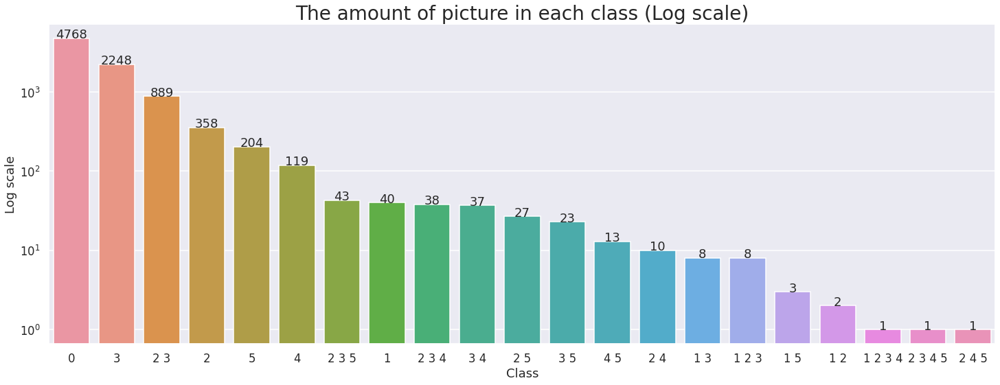

In [ ]:
order = [i for i in range(21)]
label_freq_sorted = all_labels.values

def addlabels(x,y):
  for i in order:
    plt.text(i, y[i], y[i], ha='center')

all_labels = train['labels'].value_counts()

sns.set(rc = {'figure.figsize':(22,8)})
sns.set_context("talk")

g = sns.barplot(y=all_labels.values, x=all_labels.index)
addlabels(order,label_freq_sorted)
g.set_yscale("log")
g.set_ylabel("Log scale")
g.set_xlabel("Class")
g.set_title("The amount of picture in each class (Log scale)", size=28)

#plt.savefig("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/all_labels_plot.png")

[4768, 62, 1378, 3296, 220, 315]


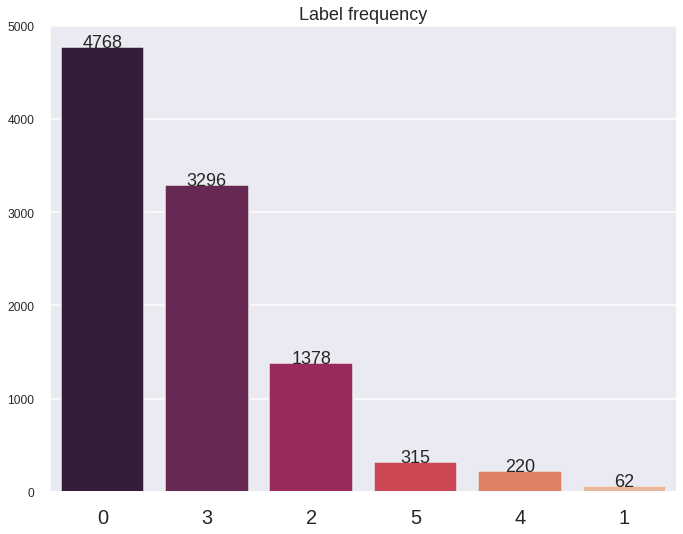

In [ ]:
# Get label frequencies in descending order
class_0 = len(df[df['0'] == 1])
class_1 = len(df[df['1'] == 1])
class_2 = len(df[df['2'] == 1])
class_3 = len(df[df['3'] == 1])
class_4 = len(df[df['4'] == 1])
class_5 = len(df[df['5'] == 1])

classes = ['0','1','2','3','4','5']
label_freq = [class_0, class_1, class_2, class_3, class_4, class_5]
label_freq_sorted = [class_0, class_3, class_2, class_5, class_4, class_1]
order = [0,3,2,5,4,1]
print(label_freq)

def addlabels(x,y):
  for i in order:
    plt.text(i, y[i], y[i], ha='center')

# Bar plot
style.use("seaborn")
sns.set_context("talk")

plt.figure(figsize=(10,8))
ax = sns.barplot(y=label_freq, x=[0,1,2,3,4,5], order=[0,3,2,5,4,1], palette="rocket")
addlabels(order, label_freq_sorted)
plt.title("Label frequency", fontsize=18)
plt.xlabel("")
plt.xticks(fontsize=20)
plt.yticks(fontsize=12)
plt.savefig("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/1-class-each-plot.png")

plt.show()

### Visualize some class

[]

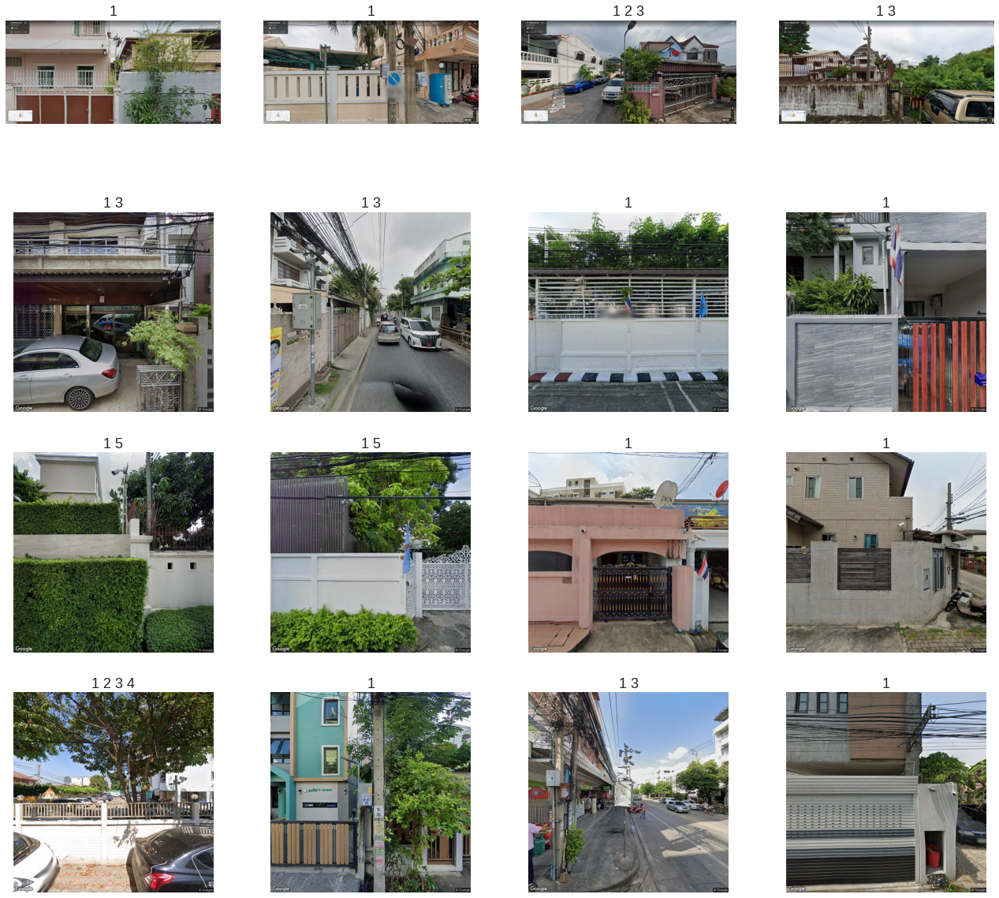

In [ ]:
ncols = 4 # Number of columns in display
nrows = 4 # Number of rows in display

sns.set_context("talk")
fig, ax = plt.subplots(nrows, ncols, figsize=(20,20))
count = 0

df_class = df[df['1'] == 1]

for i in range(nrows):
  for j in range(ncols):
    img = cv2.imread(df_class.iloc[count]['path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_LINEAR)
    ax[i,j].set_axis_off()
    ax[i,j].axis('off')
    ax[i,j].imshow(img)
    ax[i,j].set_title(df_class.iloc[count]['labels'])
    count = count + 1

plt.plot()

[]

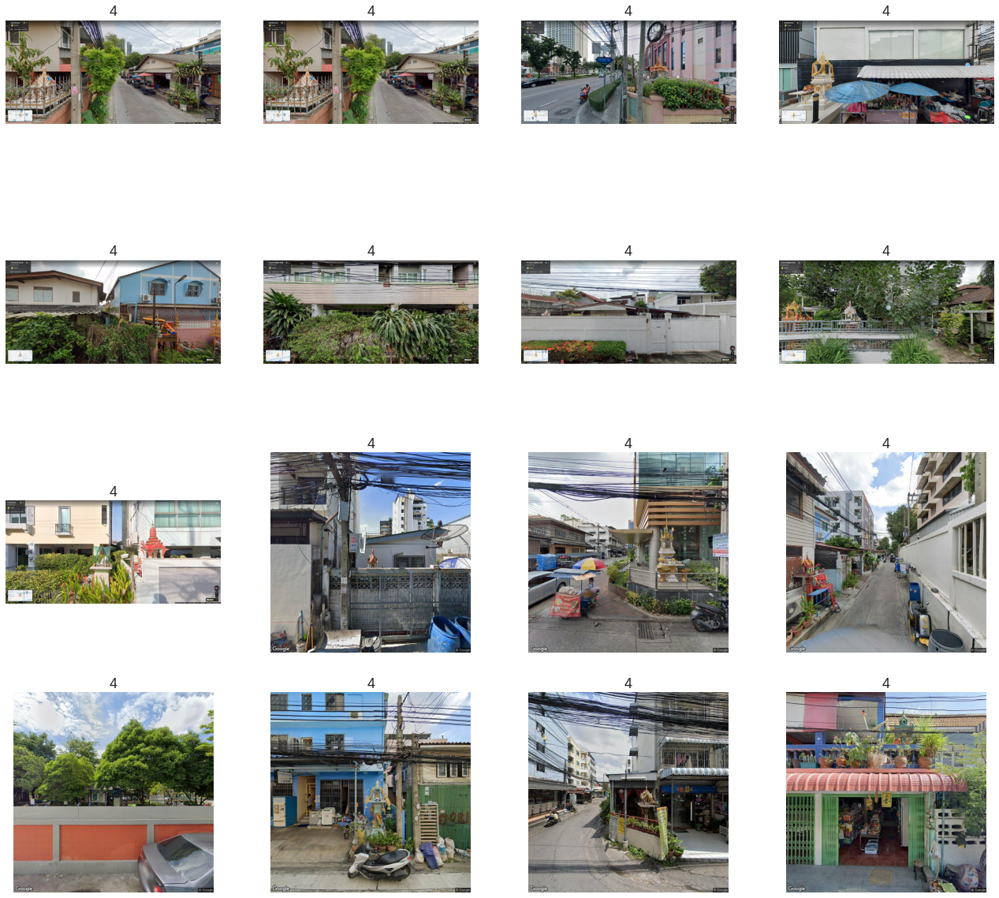

In [ ]:
ncols = 4 # Number of columns in display
nrows = 4 # Number of rows in display

sns.set_context("talk")
fig, ax = plt.subplots(nrows, ncols, figsize=(20,20))
count = 0

df_class = train[train['labels'] == '4']

for i in range(nrows):
  for j in range(ncols):
    img = cv2.imread(df_class.iloc[count]['path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_LINEAR)
    ax[i,j].set_axis_off()
    ax[i,j].axis('off')
    ax[i,j].imshow(img)
    ax[i,j].set_title(df_class.iloc[count]['labels'])
    count = count + 1

plt.plot()

# Data Preprocessing

### one hot

In [ ]:
train['labels'] = train['labels'].apply(lambda x:str(x))
train['labels_list'] = train['labels'].apply(lambda x:x.split(" "))
df_dummies = train['labels'].str.get_dummies(sep=' ')
df = pd.concat([train, df_dummies], axis=1)
# df.rename({'0':'class_0', '1':'class_1', '2':'class_2', '3':'class_3', '4':'class_4', '5':'class_5'}, axis=1, inplace=True)
df

NameError: ignored

# Put images to a Directory

### handle folder

In [ ]:
!mkdir  "/content/trainset" # will be a folder that contains every original training data

In [ ]:
# train folder
def get_all_img_path(folder_path):
  all_img_path = os.listdir(folder_path)
  all_img_path = pd.DataFrame(all_img_path, columns=['path'])
  all_img_path['path'] = all_img_path['path'].apply(lambda x: folder_path + x)
  all_img_path = all_img_path['path'].values
  return all_img_path

In [ ]:
train_df_path = train_df.loc[:, 'path'].values
extra_path = extra.loc[:, 'path'].values

In [ ]:
train_path = np.concatenate([extra_path, train_df_path])

In [ ]:
len(train_path)

8841

### copy all train file to a directory

In [ ]:
import shutil
from tqdm import tqdm

for i in tqdm(train_path):
  src_path = i
  dst_path = "/content/trainset/"
  shutil.copy(src_path, dst_path)

100%|██████████| 8841/8841 [00:13<00:00, 631.87it/s]


In [ ]:
len(os.listdir("/content/trainset"))

8841

In [ ]:
del train_df_path, extra_path, train_path # เดี๋ยว ram เต็ม

### get the correct dataframe first

In [ ]:
df.head()

,filename,path,labels,labels_list,0,1,2,3,4,5
0,MrtSutthisan_img_13-7802206_100-5717337_a257_s...,/content/properties-tagging/extra/MrtSutthisan...,0,[0],1,0,0,0,0,0
1,MrtSutthisan_img_13-7802824_100-5717195_a3_s90...,/content/properties-tagging/extra/MrtSutthisan...,0,[0],1,0,0,0,0,0
2,MrtSutthisan_img_13-7803048_100-5713201_a183_s...,/content/properties-tagging/extra/MrtSutthisan...,0,[0],1,0,0,0,0,0
3,MrtSutthisan_img_13-7813255_100-5697035_a183_s...,/content/properties-tagging/extra/MrtSutthisan...,0,[0],1,0,0,0,0,0
4,MrtSutthisan_img_13-7813311_100-5696037_a183_s...,/content/properties-tagging/extra/MrtSutthisan...,3,[3],0,0,0,1,0,0


In [ ]:
trainset_path_df = pd.DataFrame(os.listdir("/content/trainset"), columns=['filename'])
trainset_path_df['path'] = trainset_path_df['filename'].apply(lambda x: "/content/trainset/"+x)
trainset_path_df['labels'] = 0
trainset_path_df.head()

,filename,path,labels
0,img_13-7664192_100-5662988_a196-5752393_s286-5...,/content/trainset/img_13-7664192_100-5662988_a...,0
1,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset/img_13-7806387_100-5716568_a...,0
2,MrtSutthisan_img_13-7985018_100-5702739_a69_s9...,/content/trainset/MrtSutthisan_img_13-7985018_...,0
3,ChokChai4_img_13-8049643_100-6023821_a265-9988...,/content/trainset/ChokChai4_img_13-8049643_100...,0
4,img_13-7816721_100-5613382_a183-1509412_s93-15...,/content/trainset/img_13-7816721_100-5613382_a...,0


In [ ]:
trainset_df = trainset_path_df.merge(df, on='filename', how='left')
trainset_df.drop(columns=['path_y','labels_x', 'labels_list'], axis=1, inplace=True)
trainset_df.rename({"labels_y":"labels", "path_x":"path"}, axis=1, inplace=True)
trainset_df # path based on "trainset" folder

,filename,path,labels,0,1,2,3,4,5
0,img_13-7664192_100-5662988_a196-5752393_s286-5...,/content/trainset/img_13-7664192_100-5662988_a...,0,1,0,0,0,0,0
1,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset/img_13-7806387_100-5716568_a...,2 3,0,0,1,1,0,0
2,MrtSutthisan_img_13-7985018_100-5702739_a69_s9...,/content/trainset/MrtSutthisan_img_13-7985018_...,0,1,0,0,0,0,0
3,ChokChai4_img_13-8049643_100-6023821_a265-9988...,/content/trainset/ChokChai4_img_13-8049643_100...,0,1,0,0,0,0,0
4,img_13-7816721_100-5613382_a183-1509412_s93-15...,/content/trainset/img_13-7816721_100-5613382_a...,2 3,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...
8836,img_13-7927764_100-6044094_a6-771563385_s96-77...,/content/trainset/img_13-7927764_100-6044094_a...,3,0,0,0,1,0,0
8837,img_13-7827683_100-6237253_a287-7280786_s17-72...,/content/trainset/img_13-7827683_100-6237253_a...,0,1,0,0,0,0,0
8838,img_13-8239061_100-6038545_a176-3855623_s86-38...,/content/trainset/img_13-8239061_100-6038545_a...,0,1,0,0,0,0,0
8839,ChokChai4_img_13-8052332_100-6056709_a264-3455...,/content/trainset/ChokChai4_img_13-8052332_100...,0,1,0,0,0,0,0


In [ ]:
del trainset_path_df

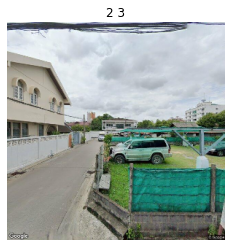

In [ ]:
im = cv2.imread(trainset_df.loc[4, 'path'])
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
im = cv2.resize(im, (299, 299), interpolation=cv2.INTER_LINEAR)

#cv2_imshow(im)
plt.imshow(im)
plt.axis('off')
plt.title(trainset_df.loc[4, 'labels'])
plt.show()

# Albumentations

### functions

In [ ]:
def get_augmented_image(org_img, albs, num_pics): #org_img : numpy array height*width*3
  img_list = []

  for _ in range(num_pics):
    aug_img = albs(image = org_img)['image']
    img_list.append(aug_img)
  
  return img_list

In [ ]:
def plot_augmented_image(img_list, nrows, ncols):
  label_list = []

  for _ in range(nrows*ncols):
    #aug_img = albs(image = org_img)['image']
    #img_list.append(aug_img)
    label_list.append('Compose')

  fig, ax = plt.subplots(figsize = (22, 5*nrows), nrows = nrows, ncols = ncols)

  count = 0
  for i in range(nrows):
    for j in range(ncols):
      ax[i,j].imshow(img_list[count])
      ax[i,j].set_title(label_list[count])
      count = count + 1

  plt.subplots_adjust(wspace=0.25, hspace=0.15)
  plt.suptitle('Albumentation')

### example

In [ ]:
from albumentations import *
import albumentations as A
import cv2

transform = A.Compose([
    #A.RandomCrop(width=256, height=256, p =0.5),
    A.HorizontalFlip(p=0.8),
    A.RandomBrightnessContrast(p=0.5, brightness_limit=(-0.1,.2), contrast_limit=(-0.1,.2)),
    A.CoarseDropout(p=0.2, max_holes = 50),
    A.Crop(x_min = 50, y_min = 50, x_max = 250, y_max = 250, p = 0.5)
])

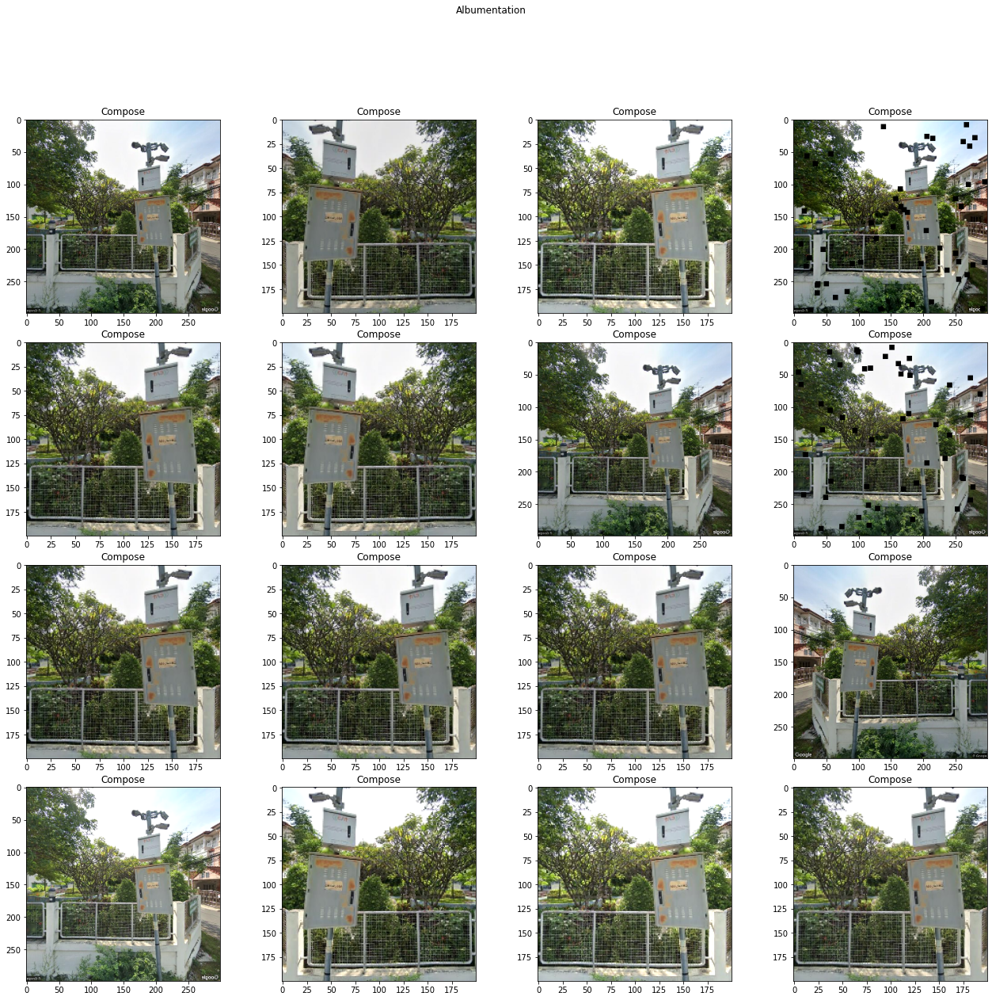

In [ ]:
img_list = get_augmented_image(org_img, albs=transform, num_pics=16)
plot_augmented_image(img_list, 4, 4)

# 2000 images each

#### handle the amount of pictures

In [ ]:
print("""Class 0 : {}
Class 1 : {}
Class 2 : {}
Class 3 : {}
Class 4 : {}
Class 5 : {}""".format(class_0, class_1, class_2, class_3, class_4, class_5))

Class 0 : 4768
Class 1 : 62
Class 2 : 1378
Class 3 : 3296
Class 4 : 220
Class 5 : 315


> will put everything new to a folder trainset_preprocessed
- need to remove class 0 : 2768
- need to add    class 1 : 1938
- need to add    class 2 : 622
- need to remove class 3 : 1296
- need to add    class 4 : 1780
- need to add    class 5 : 1685

### Function for Augmentation

In [ ]:
from albumentations import *
import albumentations as A
import cv2
from PIL import Image

def read_pic(path): #size=(299,299)
  img = cv2.imread(path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  size = img.shape
  if (size==(299,299)):
    img = cv2.resize(img, size, interpolation=cv2.INTER_LINEAR)
  return img

def create_albumentation(img_size):
  if img_size==(640,640):
    transform = A.Compose([
      A.RandomCrop(width=500, height=500, p=0.5),
      A.HorizontalFlip(p=0.8),
      A.RandomBrightnessContrast(p=0.5, brightness_limit=(-0.1,.1), contrast_limit=(-0.1,.1)),
      A.CLAHE(p=0.6, clip_limit=4.0, tile_grid_size=(8, 8)) #make contrast shaper
      #A.CoarseDropout(p=0.2, max_holes = 50),
      #A.Crop(x_min = 50, y_min = 50, x_max = 250, y_max = 250, p = 0.7)
    ])
  elif img_size==(925,1920):
    transform = A.Compose([
      A.RandomCrop(width=1500, height=700, p=0.5),
      A.HorizontalFlip(p=0.8),
      A.RandomBrightnessContrast(p=0.5, brightness_limit=(-0.1,.1), contrast_limit=(-0.1,.1)),
      A.CLAHE(p=0.6, clip_limit=4.0, tile_grid_size=(8, 8))
      #A.CoarseDropout(p=0.2, max_holes = 50),
      #A.Crop(x_min = 50, y_min = 50, x_max = 250, y_max = 250, p = 0.7)
    ])
  return transform

# -----------------------------------------------------------------------------------------------------------------------------------------
# augment_each_class is a function for generate augmented image
# you can choose an amount of images to gen per 1 image
# then, it will gen image an save the image files in a directory you want

def augment_each_class(df_class, amountToGen, folder_name = None): # amountToGen : per image

  for i in tqdm(range(len(df_class))): # df_class is df that contains only specific label that we have selected ex. df_1
    img = read_pic(path = df_class.iloc[i]['path'])

    shape = img.shape[:2]
    print(shape)

    transform = create_albumentation(shape) # put shape of the image for selecting best albumentation in create_albumentation() function
    img_list = get_augmented_image(org_img=img, albs=transform, num_pics=amountToGen)

    #save to folder
    for j in range(len(img_list)):
      image = Image.fromarray(img_list[j], 'RGB')
      image.save('/content/{}/{}@{}.jpg'.format(folder_name, df_class.iloc[i]['filename'], j))


#### example of each size

(640, 640)


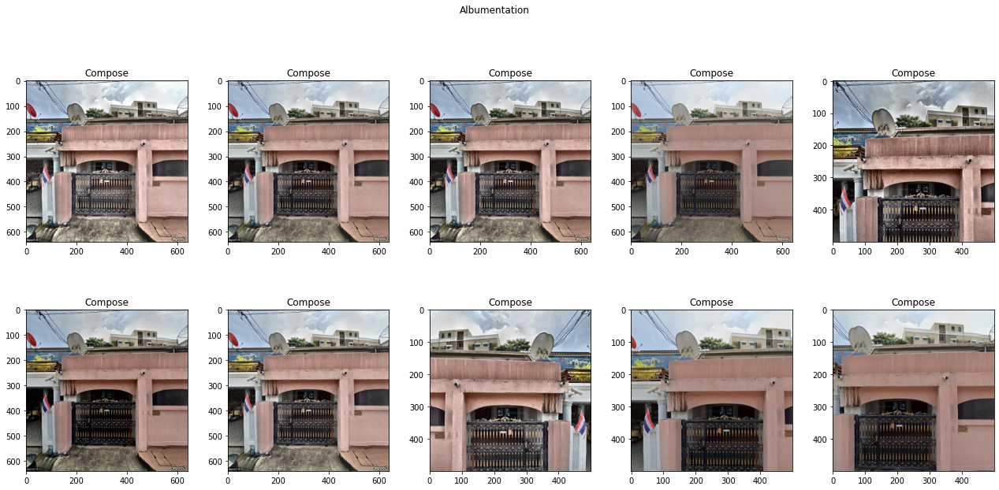

In [ ]:
from albumentations import *
import albumentations as A
import cv2

img = read_pic(path = path_1[5])
shape = img.shape[:2]
print(shape)
transform = create_albumentation(shape)

img_list = get_augmented_image(org_img=img, albs=transform, num_pics=10)
plot_augmented_image(img_list, 2,5)

(925, 1920)


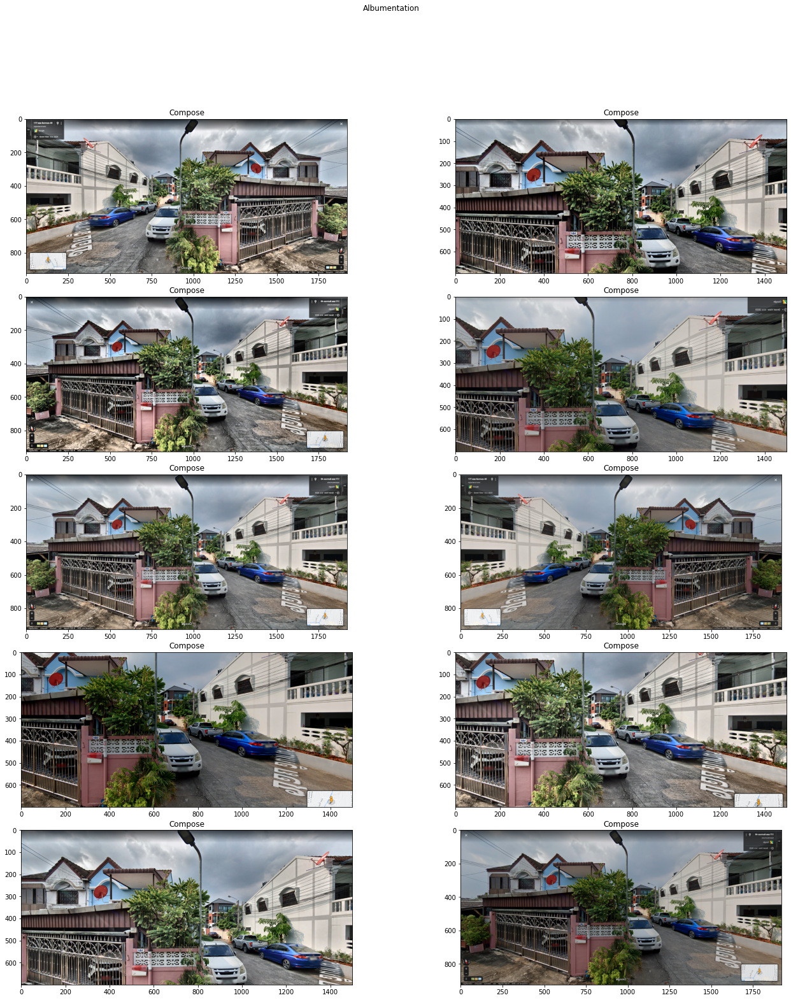

In [ ]:
from albumentations import *
import albumentations as A
import cv2

img = read_pic(path = path_1[4])
shape = img.shape[:2]
print(shape)
transform = create_albumentation(shape)

img_list = get_augmented_image(org_img=img, albs=transform, num_pics=10)
plot_augmented_image(img_list, 5,2)

### remove some pic from class 0

In [ ]:
!mkdir /content/trainset_preprocessed_0

In [ ]:
df_0 = trainset_df[trainset_df['0'] == 1]
df_0 = df_0[:2000]
df_0

,filename,path,labels,0,1,2,3,4,5
0,img_13-7664192_100-5662988_a196-5752393_s286-5...,/content/trainset/img_13-7664192_100-5662988_a...,0,1,0,0,0,0,0
2,MrtSutthisan_img_13-7985018_100-5702739_a69_s9...,/content/trainset/MrtSutthisan_img_13-7985018_...,0,1,0,0,0,0,0
3,ChokChai4_img_13-8049643_100-6023821_a265-9988...,/content/trainset/ChokChai4_img_13-8049643_100...,0,1,0,0,0,0,0
7,img_13-7770161_100-5704878_a2-885546387_s92-88...,/content/trainset/img_13-7770161_100-5704878_a...,0,1,0,0,0,0,0
9,img_13-7688148_100-556689_a202-8189359_s112-81...,/content/trainset/img_13-7688148_100-556689_a2...,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
3733,img_13-7836034_100-5933884_a81-50573677_s171-5...,/content/trainset/img_13-7836034_100-5933884_a...,0,1,0,0,0,0,0
3734,img_13-7793147_100-5815722_a293-5107034_s203-5...,/content/trainset/img_13-7793147_100-5815722_a...,0,1,0,0,0,0,0
3735,img_13-8364681_100-5914857_a272-0084809_s182-0...,/content/trainset/img_13-8364681_100-5914857_a...,0,1,0,0,0,0,0
3739,img_13-7613028_100-5383644_a27-81251466_s117-8...,/content/trainset/img_13-7613028_100-5383644_a...,0,1,0,0,0,0,0


In [ ]:
path = df_0.loc[:, 'path'].values

import shutil
from tqdm import tqdm

for i in tqdm(path):
  src_path = i
  dst_path = "/content/trainset_preprocessed_0/"
  shutil.copy(src_path, dst_path)

100%|██████████| 2000/2000 [00:02<00:00, 979.10it/s]


Add new path to access image in a new directory

In [ ]:
df_0['path'] = df_0['filename'].apply(lambda x:"/content/trainset_preprocessed_0/"+x)
df_0

,filename,path,labels,0,1,2,3,4,5
0,img_13-7664192_100-5662988_a196-5752393_s286-5...,/content/trainset_preprocessed_0/img_13-766419...,0,1,0,0,0,0,0
2,MrtSutthisan_img_13-7985018_100-5702739_a69_s9...,/content/trainset_preprocessed_0/MrtSutthisan_...,0,1,0,0,0,0,0
3,ChokChai4_img_13-8049643_100-6023821_a265-9988...,/content/trainset_preprocessed_0/ChokChai4_img...,0,1,0,0,0,0,0
7,img_13-7770161_100-5704878_a2-885546387_s92-88...,/content/trainset_preprocessed_0/img_13-777016...,0,1,0,0,0,0,0
9,img_13-7688148_100-556689_a202-8189359_s112-81...,/content/trainset_preprocessed_0/img_13-768814...,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
3733,img_13-7836034_100-5933884_a81-50573677_s171-5...,/content/trainset_preprocessed_0/img_13-783603...,0,1,0,0,0,0,0
3734,img_13-7793147_100-5815722_a293-5107034_s203-5...,/content/trainset_preprocessed_0/img_13-779314...,0,1,0,0,0,0,0
3735,img_13-8364681_100-5914857_a272-0084809_s182-0...,/content/trainset_preprocessed_0/img_13-836468...,0,1,0,0,0,0,0
3739,img_13-7613028_100-5383644_a27-81251466_s117-8...,/content/trainset_preprocessed_0/img_13-761302...,0,1,0,0,0,0,0


### add class 1

In [ ]:
!mkdir /content/trainset_preprocessed_1

In [ ]:
df_1 = trainset_df[trainset_df['1'] == 1]
df_1.head()

,filename,path,labels,0,1,2,3,4,5
43,ChokChai4_img_13-8005939_100-5913563_a188-2135...,/content/trainset/ChokChai4_img_13-8005939_100...,1,0,1,0,0,0,0
83,img_13-7873814_100-5851546_a274-2644035_s4-264...,/content/trainset/img_13-7873814_100-5851546_a...,1 2,0,1,1,0,0,0
358,img_13-7929048_100-5813087_a170-854978810626_s...,/content/trainset/img_13-7929048_100-5813087_a...,1,0,1,0,0,0,0
630,img_13-7722172_100-6195433_a353-3196703_s263-3...,/content/trainset/img_13-7722172_100-6195433_a...,1,0,1,0,0,0,0
948,MrtSutthisan_img_13-7917385_100-5682051_a162_s...,/content/trainset/MrtSutthisan_img_13-7917385_...,1 2 3,0,1,1,1,0,0


In [ ]:
len(df_1)

62

In [ ]:
df_1['labels'].value_counts()

1          40
1 2 3       8
1 3         8
1 5         3
1 2         2
1 2 3 4     1
Name: labels, dtype: int64

augment it all and save to folder "trainset_preprocessed_1"

In [ ]:
augment_each_class(df_class = df_1, amountToGen = 32, folder_name = "trainset_preprocessed_1")

  0%|          | 0/62 [00:00<?, ?it/s]

(640, 640)


  2%|▏         | 1/62 [00:01<01:16,  1.26s/it]

(640, 640)


  3%|▎         | 2/62 [00:01<00:55,  1.08it/s]

(640, 640)


  5%|▍         | 3/62 [00:02<00:48,  1.22it/s]

(640, 640)


  6%|▋         | 4/62 [00:03<00:43,  1.32it/s]

(925, 1920)


  8%|▊         | 5/62 [00:06<01:24,  1.48s/it]

(640, 640)


 10%|▉         | 6/62 [00:06<01:09,  1.23s/it]

(640, 640)


 11%|█▏        | 7/62 [00:07<00:57,  1.05s/it]

(640, 640)


 13%|█▎        | 8/62 [00:08<00:51,  1.06it/s]

(925, 1920)


 15%|█▍        | 9/62 [00:11<01:22,  1.55s/it]

(640, 640)


 16%|█▌        | 10/62 [00:11<01:07,  1.30s/it]

(640, 640)


 18%|█▊        | 11/62 [00:12<00:56,  1.11s/it]

(640, 640)


 19%|█▉        | 12/62 [00:13<00:49,  1.01it/s]

(640, 640)


 21%|██        | 13/62 [00:13<00:44,  1.10it/s]

(640, 640)


 23%|██▎       | 14/62 [00:14<00:42,  1.14it/s]

(640, 640)


 24%|██▍       | 15/62 [00:15<00:38,  1.23it/s]

(640, 640)


 26%|██▌       | 16/62 [00:16<00:36,  1.27it/s]

(640, 640)


 27%|██▋       | 17/62 [00:16<00:34,  1.31it/s]

(640, 640)


 29%|██▉       | 18/62 [00:17<00:32,  1.34it/s]

(640, 640)


 31%|███       | 19/62 [00:18<00:31,  1.35it/s]

(640, 640)


 32%|███▏      | 20/62 [00:18<00:30,  1.38it/s]

(640, 640)


 34%|███▍      | 21/62 [00:19<00:30,  1.36it/s]

(640, 640)


 35%|███▌      | 22/62 [00:20<00:28,  1.38it/s]

(640, 640)


 37%|███▋      | 23/62 [00:21<00:28,  1.38it/s]

(640, 640)


 39%|███▊      | 24/62 [00:21<00:26,  1.41it/s]

(640, 640)


 40%|████      | 25/62 [00:22<00:26,  1.41it/s]

(640, 640)


 42%|████▏     | 26/62 [00:23<00:25,  1.43it/s]

(640, 640)


 44%|████▎     | 27/62 [00:23<00:24,  1.41it/s]

(640, 640)


 45%|████▌     | 28/62 [00:24<00:24,  1.36it/s]

(640, 640)


 47%|████▋     | 29/62 [00:25<00:23,  1.41it/s]

(640, 640)


 48%|████▊     | 30/62 [00:26<00:22,  1.40it/s]

(640, 640)


 50%|█████     | 31/62 [00:26<00:22,  1.41it/s]

(640, 640)


 52%|█████▏    | 32/62 [00:27<00:22,  1.32it/s]

(640, 640)


 53%|█████▎    | 33/62 [00:28<00:20,  1.39it/s]

(640, 640)


 55%|█████▍    | 34/62 [00:29<00:19,  1.40it/s]

(640, 640)


 56%|█████▋    | 35/62 [00:29<00:19,  1.39it/s]

(640, 640)


 58%|█████▊    | 36/62 [00:30<00:18,  1.43it/s]

(640, 640)


 60%|█████▉    | 37/62 [00:31<00:17,  1.40it/s]

(640, 640)


 61%|██████▏   | 38/62 [00:31<00:17,  1.39it/s]

(640, 640)


 63%|██████▎   | 39/62 [00:32<00:16,  1.39it/s]

(640, 640)


 65%|██████▍   | 40/62 [00:33<00:15,  1.38it/s]

(640, 640)


 66%|██████▌   | 41/62 [00:34<00:15,  1.40it/s]

(640, 640)


 68%|██████▊   | 42/62 [00:34<00:14,  1.41it/s]

(925, 1920)


 69%|██████▉   | 43/62 [00:37<00:26,  1.40s/it]

(640, 640)


 71%|███████   | 44/62 [00:38<00:21,  1.22s/it]

(640, 640)


 73%|███████▎  | 45/62 [00:39<00:17,  1.05s/it]

(640, 640)


 74%|███████▍  | 46/62 [00:39<00:15,  1.05it/s]

(640, 640)


 76%|███████▌  | 47/62 [00:40<00:13,  1.13it/s]

(640, 640)


 77%|███████▋  | 48/62 [00:41<00:11,  1.20it/s]

(640, 640)


 79%|███████▉  | 49/62 [00:42<00:10,  1.22it/s]

(640, 640)


 81%|████████  | 50/62 [00:42<00:09,  1.29it/s]

(925, 1920)


 82%|████████▏ | 51/62 [00:45<00:14,  1.32s/it]

(640, 640)


 84%|████████▍ | 52/62 [00:46<00:11,  1.17s/it]

(640, 640)


 85%|████████▌ | 53/62 [00:47<00:09,  1.04s/it]

(640, 640)


 87%|████████▋ | 54/62 [00:47<00:07,  1.04it/s]

(640, 640)


 89%|████████▊ | 55/62 [00:48<00:06,  1.14it/s]

(640, 640)


 90%|█████████ | 56/62 [00:49<00:05,  1.18it/s]

(640, 640)


 92%|█████████▏| 57/62 [00:50<00:04,  1.21it/s]

(640, 640)


 94%|█████████▎| 58/62 [00:50<00:03,  1.23it/s]

(640, 640)


 95%|█████████▌| 59/62 [00:51<00:02,  1.29it/s]

(925, 1920)


 97%|█████████▋| 60/62 [00:54<00:03,  1.50s/it]

(640, 640)


 98%|█████████▊| 61/62 [00:55<00:01,  1.28s/it]

(640, 640)


100%|██████████| 62/62 [00:56<00:00,  1.10it/s]


In [ ]:
len(os.listdir("/content/trainset_preprocessed_1"))

1984

create dataframe of class 1 that is already augmented

In [ ]:
# it will contains path file of a new directory that contains augmented images
# it also get labels of each images by merging to the trainset_df dataframe, so we can get labels of augmented images
def augment_to_dataframe(folder_name):
  path_folder = "/content/{}".format(folder_name)
  filename = sorted(os.listdir(path_folder))
  df_augmented = pd.DataFrame(data=filename, columns=['filename_augmented'])
  df_augmented['path'] = df_augmented['filename_augmented'].apply(lambda x:"/content/{}/".format(folder_name) + x)
  df_augmented['filename'] = df_augmented['filename_augmented'].apply(lambda x:x.split("@")[0])
  # ---
  # merge with trainset_df dataframe to get the label
  df_augmented = df_augmented.merge(trainset_df, on='filename', how='left')
  df_augmented.drop(['path_y'], axis=1, inplace=True)
  df_augmented.rename({"path_x":"path"}, axis=1, inplace=True)
  
  return df_augmented

In [ ]:
df_augmented_1 = augment_to_dataframe("trainset_preprocessed_1")
df_augmented_1

,filename_augmented,path,filename,labels,0,1,2,3,4,5
0,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,1 2 3,0,1,1,1,0,0
1,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,1 2 3,0,1,1,1,0,0
2,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,1 2 3,0,1,1,1,0,0
3,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,1 2 3,0,1,1,1,0,0
4,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,1 2 3,0,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...
1979,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,img_13-8431989_100-5432635_a85-1293822_s175-12...,1 2,0,1,1,0,0,0
1980,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,img_13-8431989_100-5432635_a85-1293822_s175-12...,1 2,0,1,1,0,0,0
1981,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,img_13-8431989_100-5432635_a85-1293822_s175-12...,1 2,0,1,1,0,0,0
1982,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,img_13-8431989_100-5432635_a85-1293822_s175-12...,1 2,0,1,1,0,0,0


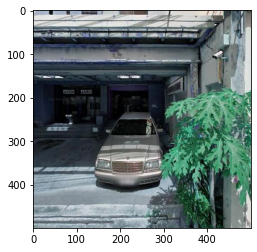

In [ ]:
img = cv2.imread(df_augmented_1.iloc[1]['path'])
plt.imshow(img)

### Add class 2 image

In [ ]:
!mkdir /content/trainset_preprocessed_2

pick first 300 pics of the image of class 2 and gen it 3 pics for each

In [ ]:
df_2 = trainset_df[trainset_df['2'] == 1]
df_2 = df_2[:300]

In [ ]:
df_2.head()

,filename,path,labels,0,1,2,3,4,5
1,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset/img_13-7806387_100-5716568_a...,2 3,0,0,1,1,0,0
4,img_13-7816721_100-5613382_a183-1509412_s93-15...,/content/trainset/img_13-7816721_100-5613382_a...,2 3,0,0,1,1,0,0
6,img_13-767959_100-6208475_a77-40253205_s347-40...,/content/trainset/img_13-767959_100-6208475_a7...,2 3,0,0,1,1,0,0
10,img_13-8129684_100-6044399_a175-8512183_s85-85...,/content/trainset/img_13-8129684_100-6044399_a...,2 3,0,0,1,1,0,0
17,MrtSutthisan_img_13-7893914_100-5705337_a80_s9...,/content/trainset/MrtSutthisan_img_13-7893914_...,2,0,0,1,0,0,0


In [ ]:
df_2['labels'].value_counts()

2 3      189
2         90
2 3 4      8
2 5        7
2 3 5      4
1 2        1
1 2 3      1
Name: labels, dtype: int64

gen 3 pics per each

In [ ]:
augment_each_class(df_class = df_2, amountToGen = 3, folder_name = "trainset_preprocessed_2")

  1%|          | 2/300 [00:00<00:22, 12.99it/s]

(640, 640)
(640, 640)
(640, 640)


  1%|▏         | 4/300 [00:00<00:19, 14.86it/s]

(640, 640)
(925, 1920)


  3%|▎         | 8/300 [00:00<00:32,  8.96it/s]

(640, 640)
(640, 640)
(640, 640)
(925, 1920)


  3%|▎         | 10/300 [00:01<00:42,  6.85it/s]

(640, 640)
(925, 1920)


  4%|▍         | 12/300 [00:01<00:49,  5.82it/s]

(640, 640)
(640, 640)
(640, 640)


  5%|▌         | 15/300 [00:02<00:38,  7.46it/s]

(640, 640)
(640, 640)
(640, 640)


  6%|▌         | 17/300 [00:02<00:31,  8.90it/s]

(925, 1920)


  6%|▋         | 19/300 [00:02<00:37,  7.39it/s]

(640, 640)
(640, 640)
(640, 640)


  8%|▊         | 23/300 [00:02<00:28,  9.81it/s]

(640, 640)
(640, 640)
(640, 640)


  8%|▊         | 25/300 [00:03<00:25, 10.76it/s]

(640, 640)
(640, 640)
(640, 640)


  9%|▉         | 27/300 [00:03<00:24, 11.18it/s]

(925, 1920)


 10%|▉         | 29/300 [00:03<00:32,  8.26it/s]

(640, 640)
(640, 640)
(640, 640)


 11%|█         | 33/300 [00:03<00:27,  9.72it/s]

(640, 640)
(640, 640)
(640, 640)


 12%|█▏        | 35/300 [00:04<00:26,  9.96it/s]

(640, 640)
(925, 1920)


 12%|█▏        | 37/300 [00:04<00:33,  7.95it/s]

(640, 640)
(640, 640)
(640, 640)


 14%|█▎        | 41/300 [00:04<00:26,  9.76it/s]

(640, 640)
(640, 640)
(640, 640)


 14%|█▍        | 43/300 [00:04<00:24, 10.57it/s]

(640, 640)
(640, 640)
(640, 640)


 16%|█▌        | 47/300 [00:05<00:21, 11.72it/s]

(640, 640)
(640, 640)
(640, 640)


 17%|█▋        | 51/300 [00:05<00:18, 13.76it/s]

(640, 640)
(640, 640)
(640, 640)
(640, 640)


 18%|█▊        | 53/300 [00:05<00:19, 12.97it/s]

(640, 640)
(925, 1920)


 18%|█▊        | 55/300 [00:06<00:28,  8.61it/s]

(640, 640)
(640, 640)
(640, 640)


 20%|█▉        | 59/300 [00:06<00:23, 10.29it/s]

(640, 640)
(640, 640)
(640, 640)


 20%|██        | 61/300 [00:06<00:21, 11.23it/s]

(640, 640)
(640, 640)
(640, 640)


 21%|██        | 63/300 [00:06<00:20, 11.54it/s]

(640, 640)
(925, 1920)


 22%|██▏       | 65/300 [00:07<00:26,  8.92it/s]

(925, 1920)


 22%|██▏       | 67/300 [00:07<00:34,  6.69it/s]

(640, 640)
(640, 640)
(640, 640)


 23%|██▎       | 69/300 [00:07<00:29,  7.84it/s]

(640, 640)
(925, 1920)


 24%|██▍       | 73/300 [00:08<00:30,  7.51it/s]

(640, 640)
(640, 640)
(640, 640)


 25%|██▌       | 75/300 [00:08<00:26,  8.44it/s]

(640, 640)
(640, 640)
(640, 640)


 26%|██▋       | 79/300 [00:08<00:21, 10.15it/s]

(640, 640)
(640, 640)
(640, 640)


 27%|██▋       | 81/300 [00:08<00:21, 10.22it/s]

(640, 640)
(640, 640)
(640, 640)


 28%|██▊       | 85/300 [00:09<00:18, 11.78it/s]

(640, 640)
(640, 640)
(925, 1920)


 29%|██▉       | 87/300 [00:09<00:25,  8.48it/s]

(640, 640)
(640, 640)
(925, 1920)


 30%|███       | 91/300 [00:10<00:25,  8.32it/s]

(640, 640)
(640, 640)
(640, 640)


 32%|███▏      | 95/300 [00:10<00:18, 10.91it/s]

(640, 640)
(640, 640)
(640, 640)
(640, 640)


 32%|███▏      | 97/300 [00:10<00:18, 11.08it/s]

(640, 640)
(640, 640)
(640, 640)


 33%|███▎      | 99/300 [00:10<00:16, 11.99it/s]

(640, 640)
(925, 1920)


 34%|███▍      | 103/300 [00:11<00:23,  8.35it/s]

(640, 640)
(640, 640)
(640, 640)


 35%|███▌      | 105/300 [00:11<00:20,  9.32it/s]

(640, 640)
(925, 1920)


 36%|███▌      | 107/300 [00:11<00:26,  7.37it/s]

(640, 640)
(925, 1920)


 37%|███▋      | 110/300 [00:12<00:24,  7.85it/s]

(640, 640)
(640, 640)
(640, 640)


 37%|███▋      | 112/300 [00:12<00:21,  8.78it/s]

(640, 640)
(925, 1920)


 38%|███▊      | 114/300 [00:13<00:29,  6.37it/s]

(640, 640)
(640, 640)
(640, 640)


 39%|███▊      | 116/300 [00:13<00:23,  7.80it/s]

(640, 640)
(925, 1920)


 40%|████      | 120/300 [00:13<00:21,  8.46it/s]

(640, 640)
(640, 640)
(640, 640)


 41%|████▏     | 124/300 [00:13<00:16, 10.52it/s]

(640, 640)
(640, 640)
(640, 640)


 42%|████▏     | 126/300 [00:14<00:14, 11.63it/s]

(640, 640)
(640, 640)
(640, 640)
(640, 640)


 43%|████▎     | 130/300 [00:14<00:13, 12.56it/s]

(640, 640)
(640, 640)
(640, 640)


 45%|████▍     | 134/300 [00:14<00:12, 13.47it/s]

(640, 640)
(640, 640)
(640, 640)
(640, 640)


 45%|████▌     | 136/300 [00:14<00:12, 13.39it/s]

(640, 640)
(640, 640)
(640, 640)


 47%|████▋     | 140/300 [00:15<00:12, 12.86it/s]

(640, 640)
(640, 640)
(640, 640)


 47%|████▋     | 142/300 [00:15<00:12, 12.38it/s]

(640, 640)
(925, 1920)


 48%|████▊     | 144/300 [00:15<00:18,  8.47it/s]

(640, 640)
(640, 640)
(640, 640)


 49%|████▉     | 148/300 [00:16<00:15,  9.97it/s]

(640, 640)
(640, 640)
(925, 1920)


 50%|█████     | 150/300 [00:16<00:19,  7.52it/s]

(640, 640)
(640, 640)
(925, 1920)


 51%|█████▏    | 154/300 [00:17<00:19,  7.45it/s]

(640, 640)
(640, 640)
(925, 1920)


 52%|█████▏    | 155/300 [00:17<00:25,  5.71it/s]

(925, 1920)


 53%|█████▎    | 158/300 [00:17<00:23,  5.96it/s]

(640, 640)
(640, 640)
(640, 640)


 53%|█████▎    | 160/300 [00:18<00:19,  7.25it/s]

(640, 640)
(640, 640)
(640, 640)


 55%|█████▍    | 164/300 [00:18<00:13,  9.93it/s]

(640, 640)
(640, 640)
(640, 640)


 55%|█████▌    | 166/300 [00:18<00:12, 11.00it/s]

(640, 640)
(925, 1920)


 56%|█████▌    | 168/300 [00:18<00:15,  8.47it/s]

(640, 640)
(640, 640)
(640, 640)


 57%|█████▋    | 172/300 [00:19<00:12, 10.23it/s]

(640, 640)
(640, 640)
(640, 640)
(640, 640)


 58%|█████▊    | 174/300 [00:19<00:11, 10.89it/s]

(640, 640)
(640, 640)


 59%|█████▉    | 178/300 [00:19<00:10, 11.57it/s]

(640, 640)
(640, 640)
(925, 1920)


 60%|██████    | 180/300 [00:20<00:14,  8.55it/s]

(640, 640)
(640, 640)
(640, 640)


 61%|██████▏   | 184/300 [00:20<00:10, 10.57it/s]

(640, 640)
(640, 640)
(925, 1920)


 62%|██████▏   | 186/300 [00:20<00:13,  8.62it/s]

(640, 640)
(640, 640)
(640, 640)


 63%|██████▎   | 190/300 [00:21<00:11,  9.58it/s]

(640, 640)
(640, 640)
(640, 640)


 64%|██████▍   | 192/300 [00:21<00:10, 10.08it/s]

(640, 640)
(640, 640)
(640, 640)


 65%|██████▌   | 196/300 [00:21<00:08, 11.71it/s]

(640, 640)
(640, 640)
(640, 640)
(925, 1920)


 67%|██████▋   | 200/300 [00:22<00:10,  9.54it/s]

(640, 640)
(640, 640)
(640, 640)


 67%|██████▋   | 202/300 [00:22<00:09, 10.46it/s]

(640, 640)
(640, 640)
(640, 640)


 68%|██████▊   | 204/300 [00:22<00:08, 10.70it/s]

(925, 1920)


 69%|██████▊   | 206/300 [00:23<00:15,  6.08it/s]

(925, 1920)


 69%|██████▉   | 208/300 [00:23<00:12,  7.35it/s]

(640, 640)
(640, 640)
(640, 640)


 70%|███████   | 210/300 [00:23<00:10,  8.36it/s]

(640, 640)
(640, 640)
(640, 640)


 71%|███████▏  | 214/300 [00:23<00:08,  9.84it/s]

(640, 640)
(640, 640)
(640, 640)
(925, 1920)


 72%|███████▏  | 216/300 [00:24<00:12,  6.80it/s]

(640, 640)
(925, 1920)


 73%|███████▎  | 220/300 [00:24<00:11,  7.22it/s]

(640, 640)
(640, 640)
(640, 640)


 74%|███████▍  | 223/300 [00:24<00:08,  9.14it/s]

(640, 640)
(640, 640)
(640, 640)
(640, 640)


 76%|███████▌  | 227/300 [00:25<00:06, 10.84it/s]

(640, 640)
(640, 640)
(640, 640)
(925, 1920)


 77%|███████▋  | 231/300 [00:26<00:09,  7.66it/s]

(640, 640)
(640, 640)
(640, 640)


 78%|███████▊  | 235/300 [00:26<00:06, 10.19it/s]

(640, 640)
(640, 640)
(640, 640)
(640, 640)


 79%|███████▉  | 237/300 [00:26<00:05, 11.41it/s]

(640, 640)
(925, 1920)


 80%|███████▉  | 239/300 [00:26<00:07,  8.58it/s]

(640, 640)
(640, 640)
(640, 640)


 81%|████████  | 243/300 [00:27<00:05, 10.87it/s]

(640, 640)
(640, 640)
(640, 640)


 82%|████████▏ | 247/300 [00:27<00:04, 12.27it/s]

(640, 640)
(640, 640)
(640, 640)


 83%|████████▎ | 249/300 [00:27<00:04, 11.71it/s]

(640, 640)
(640, 640)
(640, 640)


 84%|████████▎ | 251/300 [00:27<00:03, 12.57it/s]

(640, 640)
(640, 640)
(640, 640)


 85%|████████▌ | 255/300 [00:27<00:03, 13.52it/s]

(640, 640)
(640, 640)
(640, 640)
(640, 640)


 86%|████████▋ | 259/300 [00:28<00:02, 14.84it/s]

(640, 640)
(640, 640)
(640, 640)
(640, 640)


 88%|████████▊ | 263/300 [00:28<00:02, 13.66it/s]

(640, 640)
(640, 640)
(640, 640)


 88%|████████▊ | 265/300 [00:28<00:02, 12.84it/s]

(640, 640)
(925, 1920)


 89%|████████▉ | 267/300 [00:29<00:04,  8.03it/s]

(640, 640)
(925, 1920)


 90%|█████████ | 270/300 [00:29<00:04,  6.56it/s]

(640, 640)
(640, 640)
(640, 640)


 91%|█████████ | 272/300 [00:29<00:03,  7.71it/s]

(640, 640)
(640, 640)
(640, 640)


 92%|█████████▏| 276/300 [00:30<00:02,  9.83it/s]

(640, 640)
(640, 640)
(640, 640)


 93%|█████████▎| 278/300 [00:30<00:02, 10.92it/s]

(640, 640)
(640, 640)
(640, 640)


 93%|█████████▎| 280/300 [00:30<00:01, 11.23it/s]

(925, 1920)


 94%|█████████▍| 282/300 [00:31<00:02,  7.07it/s]

(925, 1920)
(640, 640)


 95%|█████████▍| 284/300 [00:31<00:01,  8.01it/s]

(640, 640)
(640, 640)
(640, 640)


 96%|█████████▌| 288/300 [00:31<00:01,  9.62it/s]

(640, 640)
(640, 640)
(925, 1920)
(640, 640)


 97%|█████████▋| 292/300 [00:32<00:00,  9.08it/s]

(640, 640)
(640, 640)
(640, 640)


 99%|█████████▊| 296/300 [00:32<00:00, 11.34it/s]

(640, 640)
(640, 640)
(640, 640)


 99%|█████████▉| 298/300 [00:32<00:00, 11.67it/s]

(640, 640)
(640, 640)
(640, 640)


100%|██████████| 300/300 [00:32<00:00,  9.19it/s]

(640, 640)


In [ ]:
df_augmented_2 = augment_to_dataframe(folder_name="trainset_preprocessed_2")
df_augmented_2

,filename_augmented,path,filename,labels,0,1,2,3,4,5
0,ChokChai4_img_13-7998312_100-5867274_a90-69310...,/content/trainset_preprocessed_2/ChokChai4_img...,ChokChai4_img_13-7998312_100-5867274_a90-69310...,2 5,0,0,1,0,0,1
1,ChokChai4_img_13-7998312_100-5867274_a90-69310...,/content/trainset_preprocessed_2/ChokChai4_img...,ChokChai4_img_13-7998312_100-5867274_a90-69310...,2 5,0,0,1,0,0,1
2,ChokChai4_img_13-7998312_100-5867274_a90-69310...,/content/trainset_preprocessed_2/ChokChai4_img...,ChokChai4_img_13-7998312_100-5867274_a90-69310...,2 5,0,0,1,0,0,1
3,ChokChai4_img_13-7998576_100-5883263_a90-85149...,/content/trainset_preprocessed_2/ChokChai4_img...,ChokChai4_img_13-7998576_100-5883263_a90-85149...,2 3,0,0,1,1,0,0
4,ChokChai4_img_13-7998576_100-5883263_a90-85149...,/content/trainset_preprocessed_2/ChokChai4_img...,ChokChai4_img_13-7998576_100-5883263_a90-85149...,2 3,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...
895,img_13-8525075_100-5545166_a156-5693996_s246-5...,/content/trainset_preprocessed_2/img_13-852507...,img_13-8525075_100-5545166_a156-5693996_s246-5...,2,0,0,1,0,0,0
896,img_13-8525075_100-5545166_a156-5693996_s246-5...,/content/trainset_preprocessed_2/img_13-852507...,img_13-8525075_100-5545166_a156-5693996_s246-5...,2,0,0,1,0,0,0
897,img_13-8538224_100-5714868_a90-04711996_s180-0...,/content/trainset_preprocessed_2/img_13-853822...,img_13-8538224_100-5714868_a90-04711996_s180-0...,2 3,0,0,1,1,0,0
898,img_13-8538224_100-5714868_a90-04711996_s180-0...,/content/trainset_preprocessed_2/img_13-853822...,img_13-8538224_100-5714868_a90-04711996_s180-0...,2 3,0,0,1,1,0,0


In [ ]:
df_augmented_2['labels'].value_counts()

2 3      567
2        270
2 3 4     24
2 5       21
2 3 5     12
1 2 3      3
1 2        3
Name: labels, dtype: int64

### Remove some pic from class 3

In [ ]:
!mkdir /content/trainset_preprocessed_3

In [ ]:
df_3 = trainset_df[trainset_df['3'] == 1]
df_3

,filename,path,labels,0,1,2,3,4,5
1,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset/img_13-7806387_100-5716568_a...,2 3,0,0,1,1,0,0
4,img_13-7816721_100-5613382_a183-1509412_s93-15...,/content/trainset/img_13-7816721_100-5613382_a...,2 3,0,0,1,1,0,0
5,img_13-8336597_100-5415265_a148-98428_s238-984...,/content/trainset/img_13-8336597_100-5415265_a...,3,0,0,0,1,0,0
6,img_13-767959_100-6208475_a77-40253205_s347-40...,/content/trainset/img_13-767959_100-6208475_a7...,2 3,0,0,1,1,0,0
10,img_13-8129684_100-6044399_a175-8512183_s85-85...,/content/trainset/img_13-8129684_100-6044399_a...,2 3,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...
8830,ChokChai4_img_13-7974811_100-5906106_a178-8232...,/content/trainset/ChokChai4_img_13-7974811_100...,3,0,0,0,1,0,0
8832,img_13-7949273_100-5948666_a7-526213201_s277-5...,/content/trainset/img_13-7949273_100-5948666_a...,3,0,0,0,1,0,0
8835,img_13-7856283_100-6205479_a265-1427015_s355-1...,/content/trainset/img_13-7856283_100-6205479_a...,3,0,0,0,1,0,0
8836,img_13-7927764_100-6044094_a6-771563385_s96-77...,/content/trainset/img_13-7927764_100-6044094_a...,3,0,0,0,1,0,0


In [ ]:
df_3_only = trainset_df[(trainset_df['0'] == 0) & (trainset_df['1'] == 0) & (trainset_df['2'] == 0) &
                        (trainset_df['3'] == 1) & (trainset_df['4'] == 0) & (trainset_df['5'] == 0)]
df_3_only

,filename,path,labels,0,1,2,3,4,5
5,img_13-8336597_100-5415265_a148-98428_s238-984...,/content/trainset/img_13-8336597_100-5415265_a...,3,0,0,0,1,0,0
11,img_13-8197536_100-604973_a265-131052_s355-131...,/content/trainset/img_13-8197536_100-604973_a2...,3,0,0,0,1,0,0
21,img_13-7468663164705_100-537849752824_s90_f90_...,/content/trainset/img_13-7468663164705_100-537...,3,0,0,0,1,0,0
22,ChokChai4_img_13-8051246_100-6044759_a264-8698...,/content/trainset/ChokChai4_img_13-8051246_100...,3,0,0,0,1,0,0
24,img_13-7933977_100-6053822_a187-9213514_s97-92...,/content/trainset/img_13-7933977_100-6053822_a...,3,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...
8830,ChokChai4_img_13-7974811_100-5906106_a178-8232...,/content/trainset/ChokChai4_img_13-7974811_100...,3,0,0,0,1,0,0
8832,img_13-7949273_100-5948666_a7-526213201_s277-5...,/content/trainset/img_13-7949273_100-5948666_a...,3,0,0,0,1,0,0
8835,img_13-7856283_100-6205479_a265-1427015_s355-1...,/content/trainset/img_13-7856283_100-6205479_a...,3,0,0,0,1,0,0
8836,img_13-7927764_100-6044094_a6-771563385_s96-77...,/content/trainset/img_13-7927764_100-6044094_a...,3,0,0,0,1,0,0


need to remove 1296 images

In [ ]:
import random
index_ran = list(df_3_only.index)
random.Random(44).shuffle(index_ran)
index_ran[:5]

[3633, 4606, 7989, 7285, 6654]

In [ ]:
index_ran = index_ran[:1296]
len(index_ran)

1296

will remove 1296 rows from df_3 based on index_ran

In [ ]:
df_3.drop(index_ran, axis=0, inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
df_3

,filename,path,labels,0,1,2,3,4,5
1,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset/img_13-7806387_100-5716568_a...,2 3,0,0,1,1,0,0
4,img_13-7816721_100-5613382_a183-1509412_s93-15...,/content/trainset/img_13-7816721_100-5613382_a...,2 3,0,0,1,1,0,0
5,img_13-8336597_100-5415265_a148-98428_s238-984...,/content/trainset/img_13-8336597_100-5415265_a...,3,0,0,0,1,0,0
6,img_13-767959_100-6208475_a77-40253205_s347-40...,/content/trainset/img_13-767959_100-6208475_a7...,2 3,0,0,1,1,0,0
10,img_13-8129684_100-6044399_a175-8512183_s85-85...,/content/trainset/img_13-8129684_100-6044399_a...,2 3,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...
8824,img_13-7913754_100-5805765_a263-545619410878_s...,/content/trainset/img_13-7913754_100-5805765_a...,2 3 5,0,0,1,1,0,1
8826,img_13-7707923_100-6079186_a219-1428122_s129-1...,/content/trainset/img_13-7707923_100-6079186_a...,2 3,0,0,1,1,0,0
8829,ChokChai4_img_13-7961257_100-588582_a86-917679...,/content/trainset/ChokChai4_img_13-7961257_100...,3,0,0,0,1,0,0
8832,img_13-7949273_100-5948666_a7-526213201_s277-5...,/content/trainset/img_13-7949273_100-5948666_a...,3,0,0,0,1,0,0


In [ ]:
df_3['labels'].value_counts()

3          952
2 3        889
2 3 5       43
2 3 4       38
3 4         37
3 5         23
1 2 3        8
1 3          8
1 2 3 4      1
2 3 4 5      1
Name: labels, dtype: int64

copy images from df_3 to folder "trainset_preprocessed_3

In [ ]:
path = df_3.loc[:, 'path'].values

In [ ]:
import shutil
from tqdm import tqdm

for i in tqdm(path):
  src_path = i
  dst_path = "/content/trainset_preprocessed_3/"
  shutil.copy(src_path, dst_path)

100%|██████████| 2000/2000 [00:03<00:00, 585.47it/s]


Add new path to access image in a new directory

In [ ]:
df_3['path'] = df_3['filename'].apply(lambda x:"/content/trainset_preprocessed_3/"+x)
df_3

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,filename,path,labels,0,1,2,3,4,5
1,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset_preprocessed_3/img_13-780638...,2 3,0,0,1,1,0,0
4,img_13-7816721_100-5613382_a183-1509412_s93-15...,/content/trainset_preprocessed_3/img_13-781672...,2 3,0,0,1,1,0,0
5,img_13-8336597_100-5415265_a148-98428_s238-984...,/content/trainset_preprocessed_3/img_13-833659...,3,0,0,0,1,0,0
6,img_13-767959_100-6208475_a77-40253205_s347-40...,/content/trainset_preprocessed_3/img_13-767959...,2 3,0,0,1,1,0,0
10,img_13-8129684_100-6044399_a175-8512183_s85-85...,/content/trainset_preprocessed_3/img_13-812968...,2 3,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...
8824,img_13-7913754_100-5805765_a263-545619410878_s...,/content/trainset_preprocessed_3/img_13-791375...,2 3 5,0,0,1,1,0,1
8826,img_13-7707923_100-6079186_a219-1428122_s129-1...,/content/trainset_preprocessed_3/img_13-770792...,2 3,0,0,1,1,0,0
8829,ChokChai4_img_13-7961257_100-588582_a86-917679...,/content/trainset_preprocessed_3/ChokChai4_img...,3,0,0,0,1,0,0
8832,img_13-7949273_100-5948666_a7-526213201_s277-5...,/content/trainset_preprocessed_3/img_13-794927...,3,0,0,0,1,0,0


### Add class 4

In [ ]:
!mkdir /content/trainset_preprocessed_4

In [ ]:
df_4 = trainset_df[trainset_df['4'] == 1]
df_4

,filename,path,labels,0,1,2,3,4,5
45,img_13-7936169_100-5767057_a173-026415328912_s...,/content/trainset/img_13-7936169_100-5767057_a...,4,0,0,0,0,1,0
114,img_13-8496727_100-549179_a146-5658034_s56-565...,/content/trainset/img_13-8496727_100-549179_a1...,4,0,0,0,0,1,0
136,MrtSutthisan_img_13-7838628_100-5693815_a181_s...,/content/trainset/MrtSutthisan_img_13-7838628_...,3 4,0,0,0,1,1,0
163,ChokChai4_img_13-8014891_100-6006736_a272-0788...,/content/trainset/ChokChai4_img_13-8014891_100...,3 4,0,0,0,1,1,0
182,img_13-7575671_100-5453638_a169-9460165_s79-94...,/content/trainset/img_13-7575671_100-5453638_a...,4,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...
8733,MrtSutthisan_img_13-7896212_100-5669747_a85_s2...,/content/trainset/MrtSutthisan_img_13-7896212_...,4,0,0,0,0,1,0
8774,img_13-7835519_100-5977189_a84-19964957_s354-1...,/content/trainset/img_13-7835519_100-5977189_a...,3 4,0,0,0,1,1,0
8800,img_13-7674844_100-5567973_a203-798242_s293-79...,/content/trainset/img_13-7674844_100-5567973_a...,4,0,0,0,0,1,0
8820,img_13-8375068_100-5480039_a23-64788758_s293-6...,/content/trainset/img_13-8375068_100-5480039_a...,4,0,0,0,0,1,0


In [ ]:
df_4['labels'].value_counts()

4          119
2 3 4       38
3 4         37
4 5         13
2 4         10
1 2 3 4      1
2 4 5        1
2 3 4 5      1
Name: labels, dtype: int64

will gen 9 images per each (220*8 = 1760 images)

In [ ]:
augment_each_class(df_class = df_4, amountToGen = 9, folder_name = "trainset_preprocessed_4")

  0%|          | 1/220 [00:00<00:42,  5.17it/s]

(640, 640)
(640, 640)


  1%|          | 2/220 [00:00<00:43,  5.01it/s]

(925, 1920)


  1%|▏         | 3/220 [00:01<01:37,  2.22it/s]

(640, 640)


  2%|▏         | 4/220 [00:01<01:16,  2.81it/s]

(640, 640)


  2%|▏         | 5/220 [00:01<01:06,  3.21it/s]

(640, 640)


  3%|▎         | 6/220 [00:01<01:01,  3.50it/s]

(925, 1920)


  4%|▎         | 8/220 [00:03<01:27,  2.41it/s]

(640, 640)
(640, 640)


  5%|▍         | 10/220 [00:03<01:04,  3.26it/s]

(640, 640)
(640, 640)


  5%|▌         | 12/220 [00:03<00:52,  3.96it/s]

(640, 640)


  6%|▌         | 13/220 [00:04<00:49,  4.16it/s]

(640, 640)


  6%|▋         | 14/220 [00:04<00:46,  4.43it/s]

(640, 640)
(640, 640)


  7%|▋         | 15/220 [00:04<00:45,  4.52it/s]

(925, 1920)


  8%|▊         | 17/220 [00:05<01:24,  2.40it/s]

(640, 640)


  8%|▊         | 18/220 [00:06<01:11,  2.85it/s]

(640, 640)
(640, 640)


  9%|▊         | 19/220 [00:06<01:05,  3.07it/s]

(640, 640)


  9%|▉         | 20/220 [00:06<01:02,  3.23it/s]

(925, 1920)


 10%|█         | 22/220 [00:07<01:19,  2.49it/s]

(640, 640)


 10%|█         | 23/220 [00:07<01:07,  2.91it/s]

(640, 640)


 11%|█         | 24/220 [00:08<00:57,  3.38it/s]

(640, 640)
(640, 640)


 12%|█▏        | 26/220 [00:08<00:48,  3.97it/s]

(640, 640)
(640, 640)


 12%|█▏        | 27/220 [00:08<00:49,  3.93it/s]

(640, 640)


 13%|█▎        | 28/220 [00:08<00:47,  4.05it/s]

(640, 640)


 13%|█▎        | 29/220 [00:09<00:45,  4.17it/s]

(925, 1920)


 14%|█▍        | 31/220 [00:10<01:03,  2.95it/s]

(640, 640)
(640, 640)


 15%|█▌        | 33/220 [00:10<00:51,  3.60it/s]

(640, 640)


 15%|█▌        | 34/220 [00:10<00:47,  3.91it/s]

(640, 640)
(640, 640)


 16%|█▌        | 35/220 [00:11<00:47,  3.92it/s]

(640, 640)


 17%|█▋        | 37/220 [00:11<00:41,  4.43it/s]

(640, 640)
(640, 640)


 17%|█▋        | 38/220 [00:11<00:39,  4.62it/s]

(640, 640)


 18%|█▊        | 40/220 [00:12<00:38,  4.71it/s]

(640, 640)
(640, 640)


 19%|█▊        | 41/220 [00:12<00:36,  4.86it/s]

(640, 640)


 20%|█▉        | 43/220 [00:12<00:36,  4.79it/s]

(640, 640)


 20%|██        | 44/220 [00:12<00:36,  4.87it/s]

(640, 640)
(640, 640)


 21%|██        | 46/220 [00:13<00:34,  5.05it/s]

(640, 640)
(640, 640)


 22%|██▏       | 48/220 [00:13<00:34,  5.02it/s]

(640, 640)
(640, 640)


 22%|██▏       | 49/220 [00:13<00:35,  4.76it/s]

(640, 640)


 23%|██▎       | 51/220 [00:14<00:35,  4.75it/s]

(640, 640)
(640, 640)


 24%|██▍       | 53/220 [00:14<00:34,  4.90it/s]

(640, 640)
(925, 1920)


 25%|██▍       | 54/220 [00:15<01:07,  2.45it/s]

(640, 640)


 25%|██▌       | 56/220 [00:16<00:49,  3.31it/s]

(640, 640)
(640, 640)


 26%|██▋       | 58/220 [00:16<00:39,  4.14it/s]

(640, 640)
(925, 1920)


 27%|██▋       | 60/220 [00:17<00:55,  2.86it/s]

(640, 640)
(640, 640)

 28%|██▊       | 61/220 [00:17<00:48,  3.26it/s]


(640, 640)


 28%|██▊       | 62/220 [00:17<00:44,  3.56it/s]

(640, 640)


 29%|██▉       | 64/220 [00:18<00:38,  4.06it/s]

(640, 640)
(640, 640)


 30%|██▉       | 65/220 [00:18<00:37,  4.17it/s]

(640, 640)


 30%|███       | 67/220 [00:18<00:34,  4.38it/s]

(640, 640)


 31%|███       | 68/220 [00:19<00:33,  4.50it/s]

(640, 640)


 31%|███▏      | 69/220 [00:19<00:31,  4.74it/s]

(640, 640)
(640, 640)


 32%|███▏      | 70/220 [00:19<00:32,  4.63it/s]

(640, 640)


 32%|███▏      | 71/220 [00:19<00:31,  4.66it/s]

(640, 640)


 33%|███▎      | 73/220 [00:20<00:30,  4.85it/s]

(640, 640)
(640, 640)


 34%|███▎      | 74/220 [00:20<00:31,  4.68it/s]

(640, 640)


 34%|███▍      | 75/220 [00:20<00:32,  4.45it/s]

(640, 640)


 35%|███▍      | 76/220 [00:20<00:33,  4.30it/s]

(925, 1920)


 35%|███▌      | 78/220 [00:21<00:49,  2.86it/s]

(640, 640)
(925, 1920)


 36%|███▌      | 79/220 [00:22<01:08,  2.07it/s]

(640, 640)


 37%|███▋      | 81/220 [00:23<00:48,  2.90it/s]

(640, 640)
(640, 640)


 37%|███▋      | 82/220 [00:23<00:41,  3.33it/s]

(640, 640)


 38%|███▊      | 83/220 [00:23<00:37,  3.63it/s]

(925, 1920)


 38%|███▊      | 84/220 [00:24<01:04,  2.10it/s]

(640, 640)


 39%|███▊      | 85/220 [00:24<00:54,  2.47it/s]

(640, 640)


 40%|███▉      | 87/220 [00:25<00:39,  3.34it/s]

(640, 640)
(640, 640)


 40%|████      | 88/220 [00:25<00:36,  3.63it/s]

(925, 1920)


 40%|████      | 89/220 [00:26<00:58,  2.26it/s]

(640, 640)


 41%|████      | 90/220 [00:26<00:49,  2.63it/s]

(640, 640)


 41%|████▏     | 91/220 [00:26<00:44,  2.89it/s]

(640, 640)


 42%|████▏     | 92/220 [00:26<00:40,  3.13it/s]

(640, 640)


 42%|████▏     | 93/220 [00:27<00:38,  3.29it/s]

(640, 640)


 43%|████▎     | 95/220 [00:27<00:31,  3.91it/s]

(640, 640)
(640, 640)


 44%|████▍     | 97/220 [00:28<00:28,  4.39it/s]

(640, 640)
(640, 640)


 45%|████▍     | 98/220 [00:28<00:27,  4.41it/s]

(925, 1920)


 45%|████▌     | 99/220 [00:29<00:52,  2.32it/s]

(925, 1920)


 45%|████▌     | 100/220 [00:29<01:03,  1.88it/s]

(640, 640)


 46%|████▌     | 101/220 [00:30<00:52,  2.25it/s]

(640, 640)


 46%|████▋     | 102/220 [00:30<00:44,  2.64it/s]

(640, 640)


 47%|████▋     | 103/220 [00:30<00:39,  2.95it/s]

(640, 640)


 48%|████▊     | 105/220 [00:31<00:31,  3.68it/s]

(640, 640)
(640, 640)


 48%|████▊     | 106/220 [00:31<00:27,  4.12it/s]

(640, 640)


 49%|████▊     | 107/220 [00:31<00:27,  4.12it/s]

(925, 1920)


 49%|████▉     | 108/220 [00:32<00:50,  2.23it/s]

(640, 640)


 50%|████▉     | 109/220 [00:32<00:43,  2.55it/s]

(925, 1920)


 50%|█████     | 111/220 [00:33<00:48,  2.24it/s]

(640, 640)
(925, 1920)


 51%|█████▏    | 113/220 [00:34<00:44,  2.42it/s]

(640, 640)
(640, 640)


 52%|█████▏    | 115/220 [00:35<00:32,  3.19it/s]

(640, 640)


 53%|█████▎    | 116/220 [00:35<00:29,  3.58it/s]

(640, 640)
(640, 640)


 53%|█████▎    | 117/220 [00:35<00:26,  3.87it/s]

(640, 640)


 54%|█████▎    | 118/220 [00:35<00:26,  3.89it/s]

(640, 640)


 54%|█████▍    | 119/220 [00:36<00:24,  4.07it/s]

(640, 640)


 55%|█████▌    | 121/220 [00:36<00:22,  4.41it/s]

(640, 640)
(640, 640)


 55%|█████▌    | 122/220 [00:36<00:22,  4.31it/s]

(640, 640)


 56%|█████▋    | 124/220 [00:37<00:20,  4.61it/s]

(640, 640)
(640, 640)


 57%|█████▋    | 125/220 [00:37<00:20,  4.68it/s]

(640, 640)


 57%|█████▋    | 126/220 [00:37<00:20,  4.56it/s]

(640, 640)


 58%|█████▊    | 127/220 [00:37<00:20,  4.54it/s]

(640, 640)


 58%|█████▊    | 128/220 [00:37<00:20,  4.58it/s]

(640, 640)


 59%|█████▊    | 129/220 [00:38<00:20,  4.51it/s]

(925, 1920)


 60%|█████▉    | 131/220 [00:39<00:34,  2.62it/s]

(640, 640)
(640, 640)


 60%|██████    | 133/220 [00:39<00:25,  3.47it/s]

(640, 640)
(640, 640)


 61%|██████    | 134/220 [00:40<00:22,  3.82it/s]

(640, 640)


 62%|██████▏   | 136/220 [00:40<00:19,  4.36it/s]

(640, 640)
(640, 640)


 62%|██████▏   | 137/220 [00:40<00:19,  4.29it/s]

(640, 640)


 63%|██████▎   | 138/220 [00:40<00:18,  4.35it/s]

(640, 640)


 64%|██████▎   | 140/220 [00:41<00:17,  4.50it/s]

(640, 640)


 64%|██████▍   | 141/220 [00:41<00:17,  4.60it/s]

(640, 640)
(640, 640)


 65%|██████▌   | 143/220 [00:41<00:16,  4.64it/s]

(640, 640)
(925, 1920)


 66%|██████▌   | 145/220 [00:42<00:24,  3.07it/s]

(640, 640)


 66%|██████▋   | 146/220 [00:43<00:21,  3.51it/s]

(640, 640)
(640, 640)


 67%|██████▋   | 148/220 [00:43<00:16,  4.31it/s]

(640, 640)
(640, 640)


 68%|██████▊   | 149/220 [00:43<00:16,  4.30it/s]

(640, 640)


 68%|██████▊   | 150/220 [00:43<00:16,  4.27it/s]

(640, 640)


 69%|██████▊   | 151/220 [00:44<00:15,  4.35it/s]

(925, 1920)


 70%|██████▉   | 153/220 [00:45<00:23,  2.90it/s]

(640, 640)
(640, 640)


 70%|███████   | 155/220 [00:45<00:17,  3.64it/s]

(640, 640)
(925, 1920)


 71%|███████   | 156/220 [00:46<00:28,  2.23it/s]

(640, 640)


 71%|███████▏  | 157/220 [00:46<00:24,  2.54it/s]

(925, 1920)


 72%|███████▏  | 159/220 [00:47<00:27,  2.24it/s]

(640, 640)
(640, 640)


 73%|███████▎  | 161/220 [00:48<00:18,  3.11it/s]

(640, 640)
(640, 640)


 74%|███████▍  | 163/220 [00:48<00:14,  3.87it/s]

(640, 640)
(640, 640)


 75%|███████▍  | 164/220 [00:48<00:13,  4.24it/s]

(640, 640)


 75%|███████▌  | 165/220 [00:49<00:12,  4.27it/s]

(925, 1920)


 76%|███████▌  | 167/220 [00:49<00:16,  3.23it/s]

(640, 640)
(640, 640)


 77%|███████▋  | 169/220 [00:50<00:12,  3.93it/s]

(640, 640)
(640, 640)


 78%|███████▊  | 171/220 [00:50<00:11,  4.31it/s]

(640, 640)


 78%|███████▊  | 172/220 [00:50<00:10,  4.47it/s]

(640, 640)


 79%|███████▊  | 173/220 [00:51<00:10,  4.51it/s]

(640, 640)
(925, 1920)


 79%|███████▉  | 174/220 [00:52<00:21,  2.16it/s]

(640, 640)


 80%|███████▉  | 175/220 [00:52<00:17,  2.54it/s]

(640, 640)


 80%|████████  | 177/220 [00:52<00:12,  3.35it/s]

(640, 640)
(640, 640)


 81%|████████▏ | 179/220 [00:53<00:10,  3.99it/s]

(640, 640)
(640, 640)


 82%|████████▏ | 180/220 [00:53<00:09,  4.05it/s]

(640, 640)


 83%|████████▎ | 182/220 [00:53<00:08,  4.44it/s]

(640, 640)
(925, 1920)


 83%|████████▎ | 183/220 [00:54<00:15,  2.38it/s]

(925, 1920)


 84%|████████▎ | 184/220 [00:55<00:18,  1.90it/s]

(640, 640)


 85%|████████▍ | 186/220 [00:55<00:12,  2.70it/s]

(640, 640)
(640, 640)


 85%|████████▌ | 188/220 [00:56<00:09,  3.41it/s]

(640, 640)
(640, 640)


 86%|████████▋ | 190/220 [00:56<00:07,  3.94it/s]

(640, 640)
(640, 640)


 87%|████████▋ | 191/220 [00:57<00:06,  4.23it/s]

(925, 1920)


 87%|████████▋ | 192/220 [00:57<00:11,  2.35it/s]

(925, 1920)


 88%|████████▊ | 194/220 [00:59<00:12,  2.03it/s]

(640, 640)
(640, 640)


 89%|████████▊ | 195/220 [00:59<00:10,  2.39it/s]

(925, 1920)


 90%|████████▉ | 197/220 [01:00<00:10,  2.16it/s]

(640, 640)
(640, 640)


 90%|█████████ | 198/220 [01:00<00:08,  2.53it/s]

(640, 640)


 90%|█████████ | 199/220 [01:01<00:07,  2.84it/s]

(640, 640)


 91%|█████████▏| 201/220 [01:01<00:05,  3.69it/s]

(640, 640)
(640, 640)


 92%|█████████▏| 202/220 [01:01<00:04,  3.98it/s]

(640, 640)


 92%|█████████▏| 203/220 [01:01<00:04,  4.00it/s]

(640, 640)


 93%|█████████▎| 205/220 [01:02<00:03,  4.43it/s]

(640, 640)
(640, 640)


 94%|█████████▎| 206/220 [01:02<00:03,  4.61it/s]

(640, 640)


 95%|█████████▍| 208/220 [01:02<00:02,  4.85it/s]

(640, 640)
(640, 640)


 95%|█████████▌| 210/220 [01:03<00:01,  5.22it/s]

(640, 640)
(640, 640)


 96%|█████████▋| 212/220 [01:03<00:01,  5.03it/s]

(640, 640)
(925, 1920)


 97%|█████████▋| 213/220 [01:04<00:02,  2.58it/s]

(640, 640)


 98%|█████████▊| 215/220 [01:05<00:01,  3.22it/s]

(640, 640)
(925, 1920)


 98%|█████████▊| 216/220 [01:05<00:01,  2.12it/s]

(640, 640)


 99%|█████████▊| 217/220 [01:06<00:01,  2.54it/s]

(640, 640)


100%|█████████▉| 219/220 [01:06<00:00,  3.24it/s]

(640, 640)
(640, 640)


100%|██████████| 220/220 [01:06<00:00,  3.29it/s]


In [ ]:
df_augmented_4 = augment_to_dataframe(folder_name="trainset_preprocessed_4")
df_augmented_4

,filename_augmented,path,filename,labels,0,1,2,3,4,5
0,ChokChai4_img_13-7984606_100-6034476_a186-5801...,/content/trainset_preprocessed_4/ChokChai4_img...,ChokChai4_img_13-7984606_100-6034476_a186-5801...,4,0,0,0,0,1,0
1,ChokChai4_img_13-7984606_100-6034476_a186-5801...,/content/trainset_preprocessed_4/ChokChai4_img...,ChokChai4_img_13-7984606_100-6034476_a186-5801...,4,0,0,0,0,1,0
2,ChokChai4_img_13-7984606_100-6034476_a186-5801...,/content/trainset_preprocessed_4/ChokChai4_img...,ChokChai4_img_13-7984606_100-6034476_a186-5801...,4,0,0,0,0,1,0
3,ChokChai4_img_13-7984606_100-6034476_a186-5801...,/content/trainset_preprocessed_4/ChokChai4_img...,ChokChai4_img_13-7984606_100-6034476_a186-5801...,4,0,0,0,0,1,0
4,ChokChai4_img_13-7984606_100-6034476_a186-5801...,/content/trainset_preprocessed_4/ChokChai4_img...,ChokChai4_img_13-7984606_100-6034476_a186-5801...,4,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...
1975,img_13-8565315_100-5782499_a91-09551551_s181-0...,/content/trainset_preprocessed_4/img_13-856531...,img_13-8565315_100-5782499_a91-09551551_s181-0...,4,0,0,0,0,1,0
1976,img_13-8565315_100-5782499_a91-09551551_s181-0...,/content/trainset_preprocessed_4/img_13-856531...,img_13-8565315_100-5782499_a91-09551551_s181-0...,4,0,0,0,0,1,0
1977,img_13-8565315_100-5782499_a91-09551551_s181-0...,/content/trainset_preprocessed_4/img_13-856531...,img_13-8565315_100-5782499_a91-09551551_s181-0...,4,0,0,0,0,1,0
1978,img_13-8565315_100-5782499_a91-09551551_s181-0...,/content/trainset_preprocessed_4/img_13-856531...,img_13-8565315_100-5782499_a91-09551551_s181-0...,4,0,0,0,0,1,0


In [ ]:
df_augmented_4['labels'].value_counts()

4          1071
2 3 4       342
3 4         333
4 5         117
2 4          90
2 4 5         9
2 3 4 5       9
1 2 3 4       9
Name: labels, dtype: int64

### Add class 5

In [ ]:
!mkdir /content/trainset_preprocessed_5

In [ ]:
df_5 = trainset_df[trainset_df['5'] == 1]
df_5

,filename,path,labels,0,1,2,3,4,5
8,img_13-7816721_100-5613382_a183-1509412_s273-1...,/content/trainset/img_13-7816721_100-5613382_a...,5,0,0,0,0,0,1
29,img_13-8154814_100-5735413_a348-3168119_s258-3...,/content/trainset/img_13-8154814_100-5735413_a...,5,0,0,0,0,0,1
88,img_13-8371863_100-5644024_a73-33079471_s343-3...,/content/trainset/img_13-8371863_100-5644024_a...,5,0,0,0,0,0,1
109,img_13-834719_100-5894981_a95-40801617_s5-4080...,/content/trainset/img_13-834719_100-5894981_a9...,3 5,0,0,0,1,0,1
124,img_13-8158373_100-5734778_a353-2057694_s263-2...,/content/trainset/img_13-8158373_100-5734778_a...,5,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...
8742,MrtSutthisan_img_13-7945278_100-5700381_a82_s2...,/content/trainset/MrtSutthisan_img_13-7945278_...,2 5,0,0,1,0,0,1
8763,img_13-8277563_100-573446_a82-62483679_s172-62...,/content/trainset/img_13-8277563_100-573446_a8...,2 3 5,0,0,1,1,0,1
8815,img_13-7482272243642_100-539048346031_s90_f90_...,/content/trainset/img_13-7482272243642_100-539...,5,0,0,0,0,0,1
8824,img_13-7913754_100-5805765_a263-545619410878_s...,/content/trainset/img_13-7913754_100-5805765_a...,2 3 5,0,0,1,1,0,1


In [ ]:
df_5['labels'].value_counts()

5          204
2 3 5       43
2 5         27
3 5         23
4 5         13
1 5          3
2 4 5        1
2 3 4 5      1
Name: labels, dtype: int64

gen 5 pics per each (315*5=1575)

In [ ]:
augment_each_class(df_class = df_5, amountToGen = 5, folder_name = "trainset_preprocessed_5")

  0%|          | 1/315 [00:00<00:45,  6.90it/s]

(640, 640)
(640, 640)


  1%|          | 3/315 [00:00<00:38,  8.00it/s]

(640, 640)
(640, 640)


  2%|▏         | 5/315 [00:00<00:38,  8.15it/s]

(640, 640)
(640, 640)


  2%|▏         | 7/315 [00:00<00:38,  7.97it/s]

(640, 640)
(640, 640)


  3%|▎         | 9/315 [00:01<00:36,  8.30it/s]

(640, 640)
(640, 640)


  3%|▎         | 11/315 [00:01<00:35,  8.48it/s]

(640, 640)
(640, 640)


  4%|▍         | 13/315 [00:01<00:39,  7.67it/s]

(640, 640)
(640, 640)


  5%|▍         | 15/315 [00:01<00:37,  8.08it/s]

(640, 640)
(640, 640)


  5%|▌         | 17/315 [00:02<00:35,  8.45it/s]

(640, 640)
(640, 640)


  6%|▋         | 20/315 [00:02<00:33,  8.88it/s]

(640, 640)
(640, 640)


  7%|▋         | 21/315 [00:02<00:34,  8.52it/s]

(640, 640)
(640, 640)


  8%|▊         | 24/315 [00:02<00:32,  9.03it/s]

(640, 640)
(640, 640)


  8%|▊         | 25/315 [00:03<00:32,  8.97it/s]

(640, 640)
(640, 640)


  9%|▊         | 27/315 [00:03<00:35,  8.03it/s]

(640, 640)
(640, 640)


  9%|▉         | 28/315 [00:03<00:35,  8.07it/s]

(925, 1920)


 10%|▉         | 30/315 [00:04<00:58,  4.88it/s]

(640, 640)
(640, 640)


 10%|▉         | 31/315 [00:04<00:50,  5.63it/s]

(925, 1920)


 10%|█         | 33/315 [00:04<01:05,  4.30it/s]

(640, 640)
(640, 640)


 11%|█         | 35/315 [00:05<00:50,  5.58it/s]

(640, 640)
(640, 640)


 12%|█▏        | 38/315 [00:05<00:36,  7.58it/s]

(640, 640)
(640, 640)


 12%|█▏        | 39/315 [00:05<00:37,  7.43it/s]

(640, 640)
(640, 640)


 13%|█▎        | 40/315 [00:05<00:35,  7.65it/s]

(925, 1920)


 13%|█▎        | 42/315 [00:06<01:01,  4.41it/s]

(640, 640)
(925, 1920)


 14%|█▍        | 44/315 [00:07<01:14,  3.64it/s]

(640, 640)
(640, 640)


 15%|█▍        | 46/315 [00:07<00:54,  4.90it/s]

(640, 640)
(640, 640)


 15%|█▌        | 48/315 [00:07<00:47,  5.60it/s]

(640, 640)
(640, 640)


 16%|█▌        | 50/315 [00:07<00:40,  6.52it/s]

(640, 640)
(640, 640)


 17%|█▋        | 52/315 [00:08<00:35,  7.49it/s]

(640, 640)
(640, 640)


 17%|█▋        | 54/315 [00:08<00:34,  7.46it/s]

(640, 640)
(925, 1920)


 18%|█▊        | 56/315 [00:09<00:54,  4.72it/s]

(640, 640)
(640, 640)


 18%|█▊        | 58/315 [00:09<00:41,  6.13it/s]

(640, 640)
(925, 1920)


 19%|█▉        | 60/315 [00:09<00:51,  4.94it/s]

(640, 640)
(640, 640)


 20%|█▉        | 62/315 [00:10<00:42,  5.93it/s]

(640, 640)
(640, 640)


 20%|██        | 64/315 [00:10<00:36,  6.87it/s]

(640, 640)
(640, 640)


 21%|██        | 66/315 [00:10<00:33,  7.44it/s]

(640, 640)
(925, 1920)


 21%|██▏       | 67/315 [00:11<01:08,  3.62it/s]

(925, 1920)


 22%|██▏       | 68/315 [00:11<01:19,  3.12it/s]

(925, 1920)


 22%|██▏       | 70/315 [00:12<01:18,  3.11it/s]

(640, 640)
(640, 640)


 23%|██▎       | 72/315 [00:12<00:54,  4.47it/s]

(640, 640)
(640, 640)


 23%|██▎       | 74/315 [00:12<00:40,  5.98it/s]

(640, 640)
(925, 1920)


 24%|██▍       | 76/315 [00:13<00:50,  4.72it/s]

(640, 640)
(640, 640)


 24%|██▍       | 77/315 [00:13<00:45,  5.23it/s]

(925, 1920)


 25%|██▍       | 78/315 [00:14<01:14,  3.18it/s]

(925, 1920)


 25%|██▌       | 80/315 [00:14<01:04,  3.63it/s]

(640, 640)
(640, 640)


 26%|██▌       | 81/315 [00:14<00:54,  4.32it/s]

(925, 1920)


 26%|██▋       | 83/315 [00:15<00:56,  4.07it/s]

(640, 640)
(640, 640)


 27%|██▋       | 85/315 [00:15<00:41,  5.55it/s]

(640, 640)
(925, 1920)


 28%|██▊       | 87/315 [00:16<00:53,  4.30it/s]

(640, 640)
(640, 640)


 28%|██▊       | 88/315 [00:16<00:45,  4.95it/s]

(925, 1920)


 28%|██▊       | 89/315 [00:17<01:13,  3.09it/s]

(925, 1920)


 29%|██▉       | 91/315 [00:17<01:06,  3.36it/s]

(640, 640)
(640, 640)


 29%|██▉       | 92/315 [00:17<00:56,  3.96it/s]

(640, 640)
(925, 1920)


 30%|███       | 95/315 [00:18<00:54,  4.03it/s]

(640, 640)
(640, 640)


 31%|███       | 97/315 [00:18<00:42,  5.13it/s]

(640, 640)
(640, 640)


 31%|███▏      | 99/315 [00:19<00:36,  5.99it/s]

(640, 640)
(640, 640)


 32%|███▏      | 100/315 [00:19<00:33,  6.40it/s]

(925, 1920)


 32%|███▏      | 102/315 [00:19<00:50,  4.20it/s]

(640, 640)
(925, 1920)


 33%|███▎      | 104/315 [00:20<00:58,  3.63it/s]

(640, 640)
(640, 640)


 33%|███▎      | 105/315 [00:20<00:48,  4.34it/s]

(925, 1920)


 34%|███▍      | 107/315 [00:21<00:54,  3.79it/s]

(640, 640)
(925, 1920)


 35%|███▍      | 109/315 [00:22<01:02,  3.31it/s]

(640, 640)
(925, 1920)


 35%|███▍      | 110/315 [00:22<01:13,  2.81it/s]

(925, 1920)


 35%|███▌      | 111/315 [00:23<01:31,  2.22it/s]

(925, 1920)


 36%|███▌      | 113/315 [00:23<01:10,  2.85it/s]

(640, 640)
(640, 640)


 37%|███▋      | 115/315 [00:24<00:46,  4.28it/s]

(640, 640)
(640, 640)


 37%|███▋      | 117/315 [00:24<00:35,  5.58it/s]

(640, 640)
(640, 640)


 37%|███▋      | 118/315 [00:24<00:32,  6.07it/s]

(925, 1920)


 38%|███▊      | 120/315 [00:25<00:48,  3.99it/s]

(640, 640)
(640, 640)


 39%|███▊      | 122/315 [00:25<00:37,  5.14it/s]

(640, 640)
(640, 640)


 39%|███▉      | 124/315 [00:25<00:30,  6.18it/s]

(640, 640)
(925, 1920)


 40%|████      | 126/315 [00:26<00:43,  4.36it/s]

(640, 640)
(640, 640)


 41%|████      | 128/315 [00:26<00:32,  5.70it/s]

(640, 640)
(925, 1920)


 41%|████▏     | 130/315 [00:27<00:49,  3.73it/s]

(640, 640)
(640, 640)


 42%|████▏     | 132/315 [00:27<00:35,  5.14it/s]

(640, 640)
(925, 1920)


 43%|████▎     | 134/315 [00:28<00:47,  3.81it/s]

(640, 640)
(640, 640)


 43%|████▎     | 136/315 [00:28<00:35,  5.07it/s]

(640, 640)
(640, 640)


 44%|████▍     | 138/315 [00:28<00:26,  6.64it/s]

(640, 640)
(925, 1920)


 44%|████▍     | 140/315 [00:29<00:37,  4.64it/s]

(640, 640)
(640, 640)


 45%|████▌     | 142/315 [00:29<00:30,  5.66it/s]

(640, 640)
(640, 640)


 46%|████▌     | 144/315 [00:30<00:25,  6.66it/s]

(640, 640)
(925, 1920)


 46%|████▋     | 146/315 [00:30<00:41,  4.06it/s]

(640, 640)
(640, 640)


 47%|████▋     | 148/315 [00:31<00:34,  4.82it/s]

(640, 640)
(640, 640)


 48%|████▊     | 150/315 [00:31<00:27,  6.00it/s]

(640, 640)
(640, 640)


 48%|████▊     | 151/315 [00:31<00:25,  6.47it/s]

(925, 1920)


 49%|████▊     | 153/315 [00:32<00:34,  4.71it/s]

(640, 640)
(925, 1920)


 49%|████▉     | 155/315 [00:32<00:39,  4.01it/s]

(640, 640)
(925, 1920)


 50%|████▉     | 157/315 [00:33<00:43,  3.67it/s]

(640, 640)
(640, 640)


 50%|█████     | 159/315 [00:33<00:30,  5.10it/s]

(640, 640)
(640, 640)


 51%|█████     | 160/315 [00:33<00:27,  5.59it/s]

(925, 1920)


 51%|█████▏    | 162/315 [00:34<00:37,  4.10it/s]

(640, 640)
(925, 1920)


 52%|█████▏    | 163/315 [00:35<00:48,  3.14it/s]

(925, 1920)


 52%|█████▏    | 165/315 [00:35<00:43,  3.45it/s]

(640, 640)
(640, 640)


 53%|█████▎    | 167/315 [00:35<00:31,  4.72it/s]

(640, 640)
(640, 640)


 54%|█████▎    | 169/315 [00:36<00:23,  6.09it/s]

(640, 640)
(640, 640)


 54%|█████▍    | 171/315 [00:36<00:21,  6.61it/s]

(640, 640)
(925, 1920)


 55%|█████▍    | 173/315 [00:37<00:30,  4.62it/s]

(640, 640)
(640, 640)


 56%|█████▌    | 175/315 [00:37<00:23,  5.84it/s]

(640, 640)
(640, 640)


 56%|█████▌    | 176/315 [00:37<00:22,  6.25it/s]

(925, 1920)


 57%|█████▋    | 178/315 [00:38<00:32,  4.17it/s]

(640, 640)
(640, 640)


 57%|█████▋    | 180/315 [00:38<00:24,  5.46it/s]

(640, 640)
(640, 640)


 57%|█████▋    | 181/315 [00:38<00:23,  5.70it/s]

(925, 1920)


 58%|█████▊    | 182/315 [00:39<00:37,  3.55it/s]

(925, 1920)


 58%|█████▊    | 184/315 [00:39<00:39,  3.34it/s]

(640, 640)
(640, 640)


 59%|█████▉    | 186/315 [00:40<00:27,  4.67it/s]

(640, 640)
(925, 1920)


 59%|█████▉    | 187/315 [00:40<00:39,  3.27it/s]

(925, 1920)


 60%|██████    | 189/315 [00:41<00:41,  3.07it/s]

(640, 640)
(640, 640)


 61%|██████    | 191/315 [00:41<00:27,  4.49it/s]

(640, 640)
(640, 640)


 61%|██████▏   | 193/315 [00:41<00:21,  5.68it/s]

(640, 640)
(640, 640)


 62%|██████▏   | 194/315 [00:42<00:19,  6.08it/s]

(925, 1920)


 62%|██████▏   | 196/315 [00:42<00:26,  4.52it/s]

(640, 640)
(640, 640)


 63%|██████▎   | 198/315 [00:42<00:20,  5.82it/s]

(640, 640)
(640, 640)


 63%|██████▎   | 199/315 [00:43<00:17,  6.47it/s]

(925, 1920)


 64%|██████▍   | 201/315 [00:43<00:24,  4.70it/s]

(640, 640)
(640, 640)


 64%|██████▍   | 203/315 [00:43<00:18,  6.11it/s]

(640, 640)
(925, 1920)


 65%|██████▍   | 204/315 [00:44<00:30,  3.60it/s]

(925, 1920)


 65%|██████▌   | 206/315 [00:44<00:28,  3.80it/s]

(640, 640)
(925, 1920)


 66%|██████▌   | 208/315 [00:45<00:30,  3.47it/s]

(640, 640)
(640, 640)


 67%|██████▋   | 210/315 [00:45<00:21,  4.85it/s]

(640, 640)
(640, 640)


 67%|██████▋   | 211/315 [00:46<00:18,  5.64it/s]

(925, 1920)


 67%|██████▋   | 212/315 [00:46<00:32,  3.14it/s]

(925, 1920)


 68%|██████▊   | 214/315 [00:47<00:29,  3.48it/s]

(640, 640)
(640, 640)


 69%|██████▊   | 216/315 [00:47<00:19,  4.96it/s]

(640, 640)
(640, 640)


 69%|██████▉   | 217/315 [00:47<00:17,  5.70it/s]

(925, 1920)


 70%|██████▉   | 219/315 [00:48<00:21,  4.37it/s]

(640, 640)
(640, 640)


 70%|███████   | 221/315 [00:48<00:16,  5.64it/s]

(640, 640)
(640, 640)


 71%|███████   | 223/315 [00:48<00:14,  6.51it/s]

(640, 640)
(640, 640)


 71%|███████▏  | 225/315 [00:49<00:13,  6.88it/s]

(640, 640)
(640, 640)


 72%|███████▏  | 227/315 [00:49<00:12,  7.10it/s]

(640, 640)
(640, 640)


 72%|███████▏  | 228/315 [00:49<00:11,  7.45it/s]

(640, 640)
(640, 640)


 73%|███████▎  | 230/315 [00:49<00:10,  8.10it/s]

(925, 1920)


 74%|███████▎  | 232/315 [00:50<00:16,  5.17it/s]

(640, 640)
(640, 640)


 74%|███████▍  | 234/315 [00:50<00:13,  6.01it/s]

(640, 640)
(925, 1920)


 75%|███████▍  | 236/315 [00:51<00:16,  4.73it/s]

(640, 640)
(640, 640)


 76%|███████▌  | 238/315 [00:51<00:13,  5.86it/s]

(640, 640)
(640, 640)


 76%|███████▌  | 240/315 [00:51<00:11,  6.40it/s]

(640, 640)
(640, 640)


 77%|███████▋  | 242/315 [00:51<00:10,  7.13it/s]

(640, 640)
(640, 640)


 77%|███████▋  | 244/315 [00:52<00:09,  7.73it/s]

(640, 640)
(640, 640)


 78%|███████▊  | 245/315 [00:52<00:09,  7.33it/s]

(925, 1920)


 78%|███████▊  | 247/315 [00:52<00:13,  4.96it/s]

(640, 640)
(640, 640)


 79%|███████▉  | 249/315 [00:53<00:10,  6.30it/s]

(640, 640)
(640, 640)


 80%|███████▉  | 251/315 [00:53<00:08,  7.52it/s]

(640, 640)
(640, 640)


 80%|████████  | 253/315 [00:53<00:08,  7.52it/s]

(640, 640)
(640, 640)


 81%|████████  | 254/315 [00:53<00:08,  7.59it/s]

(925, 1920)


 81%|████████▏ | 256/315 [00:54<00:14,  4.12it/s]

(640, 640)
(640, 640)


 82%|████████▏ | 258/315 [00:54<00:10,  5.53it/s]

(640, 640)
(925, 1920)


 82%|████████▏ | 259/315 [00:55<00:15,  3.54it/s]

(925, 1920)


 83%|████████▎ | 260/315 [00:55<00:19,  2.84it/s]

(925, 1920)


 83%|████████▎ | 261/315 [00:56<00:22,  2.42it/s]

(925, 1920)


 83%|████████▎ | 263/315 [00:57<00:18,  2.76it/s]

(640, 640)
(640, 640)


 84%|████████▍ | 265/315 [00:57<00:12,  4.07it/s]

(640, 640)
(640, 640)


 84%|████████▍ | 266/315 [00:57<00:10,  4.83it/s]

(925, 1920)


 85%|████████▌ | 268/315 [00:58<00:11,  4.16it/s]

(640, 640)
(925, 1920)


 86%|████████▌ | 270/315 [00:58<00:12,  3.67it/s]

(640, 640)
(925, 1920)


 86%|████████▋ | 272/315 [00:59<00:12,  3.40it/s]

(640, 640)
(640, 640)


 87%|████████▋ | 273/315 [00:59<00:11,  3.76it/s]

(925, 1920)


 87%|████████▋ | 275/315 [01:00<00:11,  3.57it/s]

(640, 640)
(640, 640)


 88%|████████▊ | 277/315 [01:00<00:08,  4.65it/s]

(640, 640)
(925, 1920)


 89%|████████▊ | 279/315 [01:01<00:09,  3.95it/s]

(640, 640)
(640, 640)


 89%|████████▉ | 281/315 [01:01<00:06,  5.21it/s]

(640, 640)
(640, 640)


 90%|████████▉ | 282/315 [01:01<00:05,  5.62it/s]

(925, 1920)


 90%|█████████ | 284/315 [01:02<00:06,  4.54it/s]

(640, 640)
(640, 640)


 91%|█████████ | 286/315 [01:02<00:04,  5.97it/s]

(640, 640)
(640, 640)


 91%|█████████▏| 288/315 [01:02<00:03,  7.31it/s]

(640, 640)
(640, 640)


 92%|█████████▏| 290/315 [01:02<00:03,  7.27it/s]

(640, 640)
(640, 640)


 93%|█████████▎| 292/315 [01:03<00:02,  7.71it/s]

(640, 640)
(640, 640)


 93%|█████████▎| 293/315 [01:03<00:02,  7.76it/s]

(925, 1920)


 94%|█████████▎| 295/315 [01:03<00:04,  4.91it/s]

(640, 640)
(925, 1920)


 94%|█████████▍| 297/315 [01:04<00:04,  4.36it/s]

(640, 640)
(640, 640)


 95%|█████████▍| 299/315 [01:04<00:02,  5.38it/s]

(640, 640)
(640, 640)


 96%|█████████▌| 301/315 [01:05<00:02,  6.65it/s]

(640, 640)
(640, 640)


 96%|█████████▌| 303/315 [01:05<00:01,  6.52it/s]

(640, 640)
(640, 640)


 97%|█████████▋| 305/315 [01:05<00:01,  7.15it/s]

(640, 640)
(640, 640)


 97%|█████████▋| 307/315 [01:05<00:01,  7.53it/s]

(640, 640)
(640, 640)


 98%|█████████▊| 309/315 [01:06<00:00,  7.74it/s]

(640, 640)
(640, 640)


 98%|█████████▊| 310/315 [01:06<00:00,  7.65it/s]

(925, 1920)


 99%|█████████▉| 312/315 [01:06<00:00,  4.61it/s]

(640, 640)
(640, 640)


100%|█████████▉| 314/315 [01:07<00:00,  5.96it/s]

(640, 640)
(640, 640)


100%|██████████| 315/315 [01:07<00:00,  4.68it/s]


In [ ]:
df_augmented_5 = augment_to_dataframe(folder_name="trainset_preprocessed_5")
df_augmented_5

,filename_augmented,path,filename,labels,0,1,2,3,4,5
0,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_5/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,5,0,0,0,0,0,1
1,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_5/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,5,0,0,0,0,0,1
2,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_5/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,5,0,0,0,0,0,1
3,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_5/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,5,0,0,0,0,0,1
4,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_5/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,5,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...
1570,img_13-8515747_100-5807201_a353-3072058_s83-30...,/content/trainset_preprocessed_5/img_13-851574...,img_13-8515747_100-5807201_a353-3072058_s83-30...,2 5,0,0,1,0,0,1
1571,img_13-8515747_100-5807201_a353-3072058_s83-30...,/content/trainset_preprocessed_5/img_13-851574...,img_13-8515747_100-5807201_a353-3072058_s83-30...,2 5,0,0,1,0,0,1
1572,img_13-8515747_100-5807201_a353-3072058_s83-30...,/content/trainset_preprocessed_5/img_13-851574...,img_13-8515747_100-5807201_a353-3072058_s83-30...,2 5,0,0,1,0,0,1
1573,img_13-8515747_100-5807201_a353-3072058_s83-30...,/content/trainset_preprocessed_5/img_13-851574...,img_13-8515747_100-5807201_a353-3072058_s83-30...,2 5,0,0,1,0,0,1


In [ ]:
df_augmented_5['labels'].value_counts()

5          1020
2 3 5       215
2 5         135
3 5         115
4 5          65
1 5          15
2 4 5         5
2 3 4 5       5
Name: labels, dtype: int64

# Get Balanced Data

In [ ]:
!mkdir trainset_balanced

In [ ]:
path_0 = df_0.loc[:, 'path'].values
path_1 = df_augmented_1.loc[:, 'path'].values
path_2 = df_augmented_2.loc[:, 'path'].values
path_3 = df_3.loc[:, 'path'].values
path_4 = df_augmented_4.loc[:, 'path'].values
path_5 = df_augmented_5.loc[:, 'path'].values

In [ ]:
path_3[0]

'/content/trainset_preprocessed_3/img_13-7806387_100-5716568_a349-8598508_s79-8598508_y0_f90_1.jpg'

In [ ]:
print(len(path_0), len(path_1), len(path_2), len(path_3), len(path_4), len(path_5))

2000 1984 900 2000 1980 1575


### Add class 0 & 3 in "trainset_balanced"

In [ ]:
import shutil
from tqdm import tqdm

for p in tqdm(path_0):
  src_path = p
  dst_path = "/content/trainset_balanced/"
  shutil.copy(src_path, dst_path)

100%|██████████| 2000/2000 [00:02<00:00, 958.83it/s]


In [ ]:
import shutil
from tqdm import tqdm

for p in tqdm(path_3):
  src_path = p
  dst_path = "/content/trainset_balanced/"
  shutil.copy(src_path, dst_path)

100%|██████████| 2000/2000 [00:03<00:00, 568.57it/s]


In [ ]:
len(os.listdir("/content/trainset_balanced"))

4000

### Add the old pic and the augmented pic of class 1 to trainset_balanced

In [ ]:
df_1

,filename,path,labels,0,1,2,3,4,5
43,ChokChai4_img_13-8005939_100-5913563_a188-2135...,/content/trainset/ChokChai4_img_13-8005939_100...,1,0,1,0,0,0,0
83,img_13-7873814_100-5851546_a274-2644035_s4-264...,/content/trainset/img_13-7873814_100-5851546_a...,1 2,0,1,1,0,0,0
358,img_13-7929048_100-5813087_a170-854978810626_s...,/content/trainset/img_13-7929048_100-5813087_a...,1,0,1,0,0,0,0
630,img_13-7722172_100-6195433_a353-3196703_s263-3...,/content/trainset/img_13-7722172_100-6195433_a...,1,0,1,0,0,0,0
948,MrtSutthisan_img_13-7917385_100-5682051_a162_s...,/content/trainset/MrtSutthisan_img_13-7917385_...,1 2 3,0,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...
8187,img_13-7891221_100-5839751_a184-679491034784_s...,/content/trainset/img_13-7891221_100-5839751_a...,1,0,1,0,0,0,0
8209,img_13-7966948_100-5838176_a270-5829178_s0-582...,/content/trainset/img_13-7966948_100-5838176_a...,1,0,1,0,0,0,0
8480,MrtSutthisan_img_13-7869501_100-5660121_a178_s...,/content/trainset/MrtSutthisan_img_13-7869501_...,1,0,1,0,0,0,0
8502,img_13-8130293_100-5889502_a281-7204632_s191-7...,/content/trainset/img_13-8130293_100-5889502_a...,1 2 3,0,1,1,1,0,0


In [ ]:
df_augmented_1

,filename_augmented,path,filename,labels,0,1,2,3,4,5
0,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,1 2 3,0,1,1,1,0,0
1,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,1 2 3,0,1,1,1,0,0
2,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,1 2 3,0,1,1,1,0,0
3,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,1 2 3,0,1,1,1,0,0
4,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,ChokChai4_img_13-7983727_100-5885124_a357-2687...,1 2 3,0,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...
1979,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,img_13-8431989_100-5432635_a85-1293822_s175-12...,1 2,0,1,1,0,0,0
1980,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,img_13-8431989_100-5432635_a85-1293822_s175-12...,1 2,0,1,1,0,0,0
1981,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,img_13-8431989_100-5432635_a85-1293822_s175-12...,1 2,0,1,1,0,0,0
1982,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,img_13-8431989_100-5432635_a85-1293822_s175-12...,1 2,0,1,1,0,0,0


In [ ]:
path_old_1 = df_1.loc[:, 'path'].values

In [ ]:
path_all_1 = np.concatenate((path_old_1, path_1))
len(path_all_1)

2046

In [ ]:
import shutil
from tqdm import tqdm

for p in tqdm(path_all_1):
  src_path = p
  dst_path = "/content/trainset_balanced/"
  shutil.copy(src_path, dst_path)

100%|██████████| 2046/2046 [00:01<00:00, 1466.67it/s]


In [ ]:
len(os.listdir("/content/trainset_balanced"))

6029

In [ ]:
def add_to_trainset_balanced(df, df_augmented):
  path_old = df.loc[:, 'path'].values
  path_new = df_augmented.loc[:, 'path'].values
  path_all = np.concatenate((path_old, path_new))

  for p in tqdm(path_all):
    src_path = p
    dst_path = "/content/trainset_balanced/"
    shutil.copy(src_path, dst_path)

### Add with class 2, 4, 5

class 2 have problem, so I generate df_2 by myself

In [ ]:
df_2_fixed = trainset_df[trainset_df['2'] == 1]
df_2_fixed

,filename,path,labels,0,1,2,3,4,5
1,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset/img_13-7806387_100-5716568_a...,2 3,0,0,1,1,0,0
4,img_13-7816721_100-5613382_a183-1509412_s93-15...,/content/trainset/img_13-7816721_100-5613382_a...,2 3,0,0,1,1,0,0
6,img_13-767959_100-6208475_a77-40253205_s347-40...,/content/trainset/img_13-767959_100-6208475_a7...,2 3,0,0,1,1,0,0
10,img_13-8129684_100-6044399_a175-8512183_s85-85...,/content/trainset/img_13-8129684_100-6044399_a...,2 3,0,0,1,1,0,0
17,MrtSutthisan_img_13-7893914_100-5705337_a80_s9...,/content/trainset/MrtSutthisan_img_13-7893914_...,2,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...
8801,img_13-7610054_100-5592903_a110-015984_s20-015...,/content/trainset/img_13-7610054_100-5592903_a...,2 3,0,0,1,1,0,0
8809,img_13-8214121_100-5804429_a90-31425797_s180-3...,/content/trainset/img_13-8214121_100-5804429_a...,2 3,0,0,1,1,0,0
8812,img_13-8232414_100-5627254_a264-9295997_s174-9...,/content/trainset/img_13-8232414_100-5627254_a...,2 3,0,0,1,1,0,0
8824,img_13-7913754_100-5805765_a263-545619410878_s...,/content/trainset/img_13-7913754_100-5805765_a...,2 3 5,0,0,1,1,0,1


Add

In [ ]:
add_to_trainset_balanced(df_1, df_augmented_1)

100%|██████████| 2046/2046 [00:00<00:00, 2754.35it/s]


In [ ]:
len(os.listdir("/content/trainset_balanced"))

6029

In [ ]:
add_to_trainset_balanced(df_2_fixed, df_augmented_2)

100%|██████████| 2278/2278 [00:05<00:00, 404.13it/s] 


In [ ]:
len(os.listdir("/content/trainset_balanced"))

7319

In [ ]:
add_to_trainset_balanced(df_4, df_augmented_4)

100%|██████████| 2200/2200 [00:01<00:00, 2157.50it/s]


In [ ]:
len(os.listdir("/content/trainset_balanced"))

9398

In [ ]:
add_to_trainset_balanced(df_5, df_augmented_5)

100%|██████████| 1890/1890 [00:02<00:00, 702.24it/s] 


In [ ]:
len(os.listdir("/content/trainset_balanced"))

11054

### create dataframe contains all data

In [ ]:
df_balanced = pd.DataFrame(data=os.listdir("/content/trainset_balanced"), columns=['filename'])
df_balanced

,filename
0,img_13-7664192_100-5662988_a196-5752393_s286-5...
1,img_13-7806387_100-5716568_a349-8598508_s79-85...
2,MrtSutthisan_img_13-7985018_100-5702739_a69_s9...
3,MrtSutthisan_img_13-7978415_100-5705039_a76_s9...
4,img_13-796216_100-5962226_a182-318586718563_s9...
...,...
11049,img_13-7745262_100-5582393_a301-3128535_s31-31...
11050,img_13-7987056_100-5553424_a98-59907569_s8-599...
11051,img_13-7870126_100-6137125_a250-6943802_s340-6...
11052,img_13-8168823_100-6004327_a170-6428265_s80-64...


### map filename to each class

remove filename from df_augmented and rename filename_augment to filename

In [ ]:
df_1

,filename,path,labels,0,1,2,3,4,5
43,ChokChai4_img_13-8005939_100-5913563_a188-2135...,/content/trainset/ChokChai4_img_13-8005939_100...,1,0,1,0,0,0,0
83,img_13-7873814_100-5851546_a274-2644035_s4-264...,/content/trainset/img_13-7873814_100-5851546_a...,1 2,0,1,1,0,0,0
358,img_13-7929048_100-5813087_a170-854978810626_s...,/content/trainset/img_13-7929048_100-5813087_a...,1,0,1,0,0,0,0
630,img_13-7722172_100-6195433_a353-3196703_s263-3...,/content/trainset/img_13-7722172_100-6195433_a...,1,0,1,0,0,0,0
948,MrtSutthisan_img_13-7917385_100-5682051_a162_s...,/content/trainset/MrtSutthisan_img_13-7917385_...,1 2 3,0,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...
8187,img_13-7891221_100-5839751_a184-679491034784_s...,/content/trainset/img_13-7891221_100-5839751_a...,1,0,1,0,0,0,0
8209,img_13-7966948_100-5838176_a270-5829178_s0-582...,/content/trainset/img_13-7966948_100-5838176_a...,1,0,1,0,0,0,0
8480,MrtSutthisan_img_13-7869501_100-5660121_a178_s...,/content/trainset/MrtSutthisan_img_13-7869501_...,1,0,1,0,0,0,0
8502,img_13-8130293_100-5889502_a281-7204632_s191-7...,/content/trainset/img_13-8130293_100-5889502_a...,1 2 3,0,1,1,1,0,0


In [ ]:
df_augmented_1.drop("filename", axis=1, inplace=True)
df_augmented_1.rename({"filename_augmented":"filename"}, axis=1, inplace=True)
df_augmented_1

,filename,path,labels,0,1,2,3,4,5
0,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,1 2 3,0,1,1,1,0,0
1,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,1 2 3,0,1,1,1,0,0
2,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,1 2 3,0,1,1,1,0,0
3,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,1 2 3,0,1,1,1,0,0
4,ChokChai4_img_13-7983727_100-5885124_a357-2687...,/content/trainset_preprocessed_1/ChokChai4_img...,1 2 3,0,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...
1979,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,1 2,0,1,1,0,0,0
1980,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,1 2,0,1,1,0,0,0
1981,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,1 2,0,1,1,0,0,0
1982,img_13-8431989_100-5432635_a85-1293822_s175-12...,/content/trainset_preprocessed_1/img_13-843198...,1 2,0,1,1,0,0,0


In [ ]:
df_augmented_2.drop("filename", axis=1, inplace=True)
df_augmented_2.rename({"filename_augmented":"filename"}, axis=1, inplace=True)

df_augmented_4.drop("filename", axis=1, inplace=True)
df_augmented_4.rename({"filename_augmented":"filename"}, axis=1, inplace=True)

df_augmented_5.drop("filename", axis=1, inplace=True)
df_augmented_5.rename({"filename_augmented":"filename"}, axis=1, inplace=True)

In [ ]:
df_augmented_2.loc[0,'filename']

'ChokChai4_img_13-7998312_100-5867274_a90-69310051115751_s270_y0_f90_1.jpg@0.jpg'

Merge

In [ ]:
df_new = pd.concat([df_0, df_1, df_augmented_1, df_2, df_augmented_2,
                    df_3, df_4, df_augmented_4,
                    df_5, df_augmented_5], axis=0)
df_new

,filename,path,labels,0,1,2,3,4,5
0,img_13-7664192_100-5662988_a196-5752393_s286-5...,/content/trainset_preprocessed_0/img_13-766419...,0,1,0,0,0,0,0
2,MrtSutthisan_img_13-7985018_100-5702739_a69_s9...,/content/trainset_preprocessed_0/MrtSutthisan_...,0,1,0,0,0,0,0
3,ChokChai4_img_13-8049643_100-6023821_a265-9988...,/content/trainset_preprocessed_0/ChokChai4_img...,0,1,0,0,0,0,0
7,img_13-7770161_100-5704878_a2-885546387_s92-88...,/content/trainset_preprocessed_0/img_13-777016...,0,1,0,0,0,0,0
9,img_13-7688148_100-556689_a202-8189359_s112-81...,/content/trainset_preprocessed_0/img_13-768814...,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
1570,img_13-8515747_100-5807201_a353-3072058_s83-30...,/content/trainset_preprocessed_5/img_13-851574...,2 5,0,0,1,0,0,1
1571,img_13-8515747_100-5807201_a353-3072058_s83-30...,/content/trainset_preprocessed_5/img_13-851574...,2 5,0,0,1,0,0,1
1572,img_13-8515747_100-5807201_a353-3072058_s83-30...,/content/trainset_preprocessed_5/img_13-851574...,2 5,0,0,1,0,0,1
1573,img_13-8515747_100-5807201_a353-3072058_s83-30...,/content/trainset_preprocessed_5/img_13-851574...,2 5,0,0,1,0,0,1


In [ ]:
df_balanced_new = df_balanced.merge(df_new, on='filename', how='left')
df_balanced_new

,filename,path,labels,0,1,2,3,4,5
0,img_13-7664192_100-5662988_a196-5752393_s286-5...,/content/trainset_preprocessed_0/img_13-766419...,0,1.0,0.0,0.0,0.0,0.0,0.0
1,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset/img_13-7806387_100-5716568_a...,2 3,0.0,0.0,1.0,1.0,0.0,0.0
2,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset_preprocessed_3/img_13-780638...,2 3,0.0,0.0,1.0,1.0,0.0,0.0
3,MrtSutthisan_img_13-7985018_100-5702739_a69_s9...,/content/trainset_preprocessed_0/MrtSutthisan_...,0,1.0,0.0,0.0,0.0,0.0,0.0
4,MrtSutthisan_img_13-7978415_100-5705039_a76_s9...,/content/trainset_preprocessed_4/MrtSutthisan_...,4,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
11599,img_13-7745262_100-5582393_a301-3128535_s31-31...,/content/trainset_preprocessed_5/img_13-774526...,5,0.0,0.0,0.0,0.0,0.0,1.0
11600,img_13-7987056_100-5553424_a98-59907569_s8-599...,/content/trainset_preprocessed_1/img_13-798705...,1 2 3,0.0,1.0,1.0,1.0,0.0,0.0
11601,img_13-7870126_100-6137125_a250-6943802_s340-6...,/content/trainset_preprocessed_1/img_13-787012...,1,0.0,1.0,0.0,0.0,0.0,0.0
11602,img_13-8168823_100-6004327_a170-6428265_s80-64...,/content/trainset_preprocessed_4/img_13-816882...,4,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
del df_new

update path in df_balanced_new to "trainset_balanced" directory

In [ ]:
df_balanced_new['path'] = df_balanced_new['filename'].apply(lambda x: "/content/trainset_balanced/" + x)

In [ ]:
df_balanced_new

,filename,path,labels,0,1,2,3,4,5
0,img_13-7664192_100-5662988_a196-5752393_s286-5...,/content/trainset_balanced/img_13-7664192_100-...,0,1.0,0.0,0.0,0.0,0.0,0.0
1,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset_balanced/img_13-7806387_100-...,2 3,0.0,0.0,1.0,1.0,0.0,0.0
2,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/trainset_balanced/img_13-7806387_100-...,2 3,0.0,0.0,1.0,1.0,0.0,0.0
3,MrtSutthisan_img_13-7985018_100-5702739_a69_s9...,/content/trainset_balanced/MrtSutthisan_img_13...,0,1.0,0.0,0.0,0.0,0.0,0.0
4,MrtSutthisan_img_13-7978415_100-5705039_a76_s9...,/content/trainset_balanced/MrtSutthisan_img_13...,4,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
11599,img_13-7745262_100-5582393_a301-3128535_s31-31...,/content/trainset_balanced/img_13-7745262_100-...,5,0.0,0.0,0.0,0.0,0.0,1.0
11600,img_13-7987056_100-5553424_a98-59907569_s8-599...,/content/trainset_balanced/img_13-7987056_100-...,1 2 3,0.0,1.0,1.0,1.0,0.0,0.0
11601,img_13-7870126_100-6137125_a250-6943802_s340-6...,/content/trainset_balanced/img_13-7870126_100-...,1,0.0,1.0,0.0,0.0,0.0,0.0
11602,img_13-8168823_100-6004327_a170-6428265_s80-64...,/content/trainset_balanced/img_13-8168823_100-...,4,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
df_balanced_new['labels'].value_counts()

0          2000
2 3        1645
1          1320
5          1224
4          1190
3           952
2 3 4       450
3 4         407
2           360
2 3 5       317
1 2 3       276
1 3         272
4 5         208
2 5         190
3 5         161
1 5         117
2 4         100
1 2          70
1 2 3 4      44
2 3 4 5      17
2 4 5        16
Name: labels, dtype: int64

In [ ]:
df_balanced_new.to_csv("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/df_balanced_new.csv")

In [ ]:
del df, df_0, df_1, df_2, df_3, df_4, df_5, df_augmented_1, df_augmented_2, df_augmented_4, df_augmented_5

In [ ]:
path = df_balanced_new.loc[:, 'path'].values

11604

In [ ]:
import shutil
from tqdm import tqdm

for i in tqdm(path):
  src_path = i
  dst_path = "/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/trainset_balanced/"
  shutil.copy(src_path, dst_path)

100%|██████████| 11604/11604 [01:40<00:00, 115.39it/s]


# Data to flow

already save everything in drive and download it for use

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/df_balanced_true.csv")
# file csv ใส่ path มาผิด
df.drop("Unnamed: 0", axis=1, inplace=True)
#df['path'] = df['path'].apply(lambda x:"/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/trainset_balanced/" +x)
df

,filename,path,labels,0,1,2,3,4,5
0,img_13-7664192_100-5662988_a196-5752393_s286-5...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,0,1.0,0.0,0.0,0.0,0.0,0.0
1,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 3,0.0,0.0,1.0,1.0,0.0,0.0
2,img_13-7806387_100-5716568_a349-8598508_s79-85...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 3,0.0,0.0,1.0,1.0,0.0,0.0
3,MrtSutthisan_img_13-7985018_100-5702739_a69_s9...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,0,1.0,0.0,0.0,0.0,0.0,0.0
4,MrtSutthisan_img_13-7978415_100-5705039_a76_s9...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,4,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
11599,img_13-7745262_100-5582393_a301-3128535_s31-31...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,5,0.0,0.0,0.0,0.0,0.0,1.0
11600,img_13-7987056_100-5553424_a98-59907569_s8-599...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1 2 3,0.0,1.0,1.0,1.0,0.0,0.0
11601,img_13-7870126_100-6137125_a250-6943802_s340-6...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1,0.0,1.0,0.0,0.0,0.0,0.0
11602,img_13-8168823_100-6004327_a170-6428265_s80-64...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,4,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
df.loc[0, 'path']

'/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/trainset_balanced/img_13-7664192_100-5662988_a196-5752393_s286-5752393_y0_f90_1.jpg'

In [ ]:
df[df['1'] == 1]

,filename,path,labels,0,1,2,3,4,5
15,MrtSutthisan_img_13-7917385_100-5682051_a162_s...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1 2 3,0.0,1.0,1.0,1.0,0.0,0.0
24,img_13-7464007_100-5815258_a122-4514172_s32-45...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1 3,0.0,1.0,0.0,1.0,0.0,0.0
26,ChokChai4_img_13-8004443_100-5865305_a92-89613...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1 2 3,0.0,1.0,1.0,1.0,0.0,0.0
27,img_13-7967715_100-5952378_a279-456920258373_s...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1,0.0,1.0,0.0,0.0,0.0,0.0
37,img_13-7987056_100-5553424_a98-59907569_s8-599...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1 2 3,0.0,1.0,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
11595,MrtSutthisan_img_13-7918997_100-566182_a99_s90...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1 5,0.0,1.0,0.0,0.0,0.0,1.0
11596,img_13-7922149_100-5810492_a265-745238131175_s...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1,0.0,1.0,0.0,0.0,0.0,0.0
11600,img_13-7987056_100-5553424_a98-59907569_s8-599...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1 2 3,0.0,1.0,1.0,1.0,0.0,0.0
11601,img_13-7870126_100-6137125_a250-6943802_s340-6...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
df[df['filename'] == 'ChokChai4_img_13-8004108_100-5870294_a93-94671915474494_s270_y0_f90_1.jpg']

,filename,path,labels,0,1,2,3,4,5
7743,ChokChai4_img_13-8004108_100-5870294_a93-94671...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1,0.0,1.0,0.0,0.0,0.0,0.0


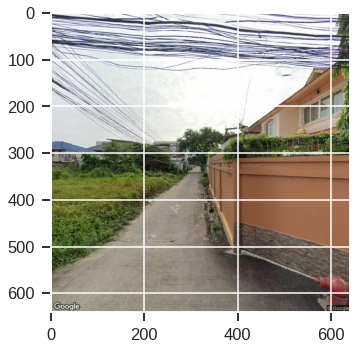

In [ ]:
img = cv2.imread(df.loc[4911, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

### explore final data

[2000, 2099, 3485, 4541, 2432, 2250]


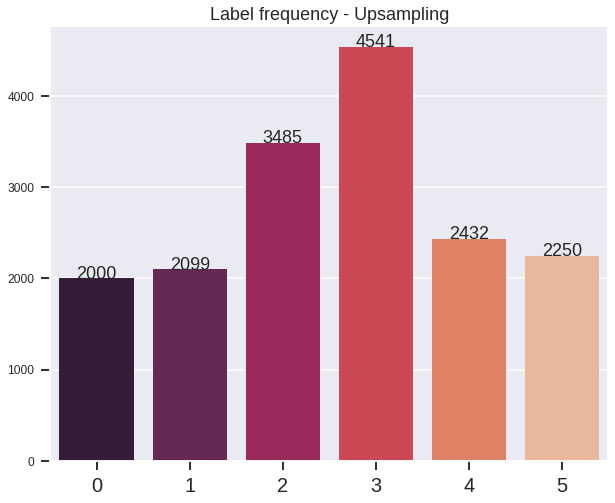

In [ ]:
# Get label frequencies in descending order
class_0 = len(df[df['0'] == 1])
class_1 = len(df[df['1'] == 1])
class_2 = len(df[df['2'] == 1])
class_3 = len(df[df['3'] == 1])
class_4 = len(df[df['4'] == 1])
class_5 = len(df[df['5'] == 1])

classes = ['0','1','2','3','4','5']
label_freq = [class_0, class_1, class_2, class_3, class_4, class_5]
order = [0,1,2,3,4,5]
print(label_freq)

def addlabels(x,y):
  for i in order:
    plt.text(i, y[i], y[i], ha='center')

# Bar plot
style.use("seaborn")
sns.set_context("talk")

plt.figure(figsize=(10,8))
ax = sns.barplot(y=label_freq, x=[0,1,2,3,4,5], palette="rocket")
addlabels(order, label_freq)
plt.title("Label frequency - Upsampling", fontsize=18)
plt.xlabel("")
plt.xticks(fontsize=20)
plt.yticks(fontsize=12)
plt.savefig("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/1-class-each-plot-Upsampling.png")

plt.show()

### train validate test

In [ ]:
import random
index = [i for i in range(0,11604)]
random.Random(44).shuffle(index)

df_train = df.loc[index[:10000]]
df_train = df_train.dropna()
df_valid = df.loc[index[10000:]]
df_valid = df_valid.dropna()

### check amount of each class

In [ ]:
class_0 = len(df_train[df_train['0'] == 1])
class_1 = len(df_train[df_train['1'] == 1])
class_2 = len(df_train[df_train['2'] == 1])
class_3 = len(df_train[df_train['3'] == 1])
class_4 = len(df_train[df_train['4'] == 1])
class_5 = len(df_train[df_train['5'] == 1])

classes = ['0','1','2','3','4','5']
label_freq = [class_0, class_1, class_2, class_3, class_4, class_5]
print(label_freq)

[1714, 1816, 3002, 3916, 2089, 1937]


In [ ]:
class_0 = len(df_valid[df_valid['0'] == 1])
class_1 = len(df_valid[df_valid['1'] == 1])
class_2 = len(df_valid[df_valid['2'] == 1])
class_3 = len(df_valid[df_valid['3'] == 1])
class_4 = len(df_valid[df_valid['4'] == 1])
class_5 = len(df_valid[df_valid['5'] == 1])

classes = ['0','1','2','3','4','5']
label_freq = [class_0, class_1, class_2, class_3, class_4, class_5]
print(label_freq)

[286, 283, 483, 625, 343, 313]


In [ ]:
df_train = df_train.dropna()
df_train

,filename,path,labels,0,1,2,3,4,5
9028,img_13-796275_100-5668345_a176-173551753067_s2...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 3,0.0,0.0,1.0,1.0,0.0,0.0
6825,img_13-7858978_100-5765533_a176-1741429_s86-17...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 3,0.0,0.0,1.0,1.0,0.0,0.0
5362,img_13-8447989_100-5950272_a246-3719166_s156-3...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,4,0.0,0.0,0.0,0.0,1.0,0.0
8816,img_13-8101556_100-5845183_a265-8341857_s355-8...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,3,0.0,0.0,0.0,1.0,0.0,0.0
983,img_13-8198513_100-5846003_a293-52942_s23-5294...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
8710,img_13-7822846_100-6117854_a6-727464177_s276-7...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,4,0.0,0.0,0.0,0.0,1.0,0.0
32,img_13-8055348_100-5967358_a270-3746818_s180-3...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,0,1.0,0.0,0.0,0.0,0.0,0.0
9767,img_13-840688_100-5686995_a350-752221_s80-7522...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1,0.0,1.0,0.0,0.0,0.0,0.0
11467,img_13-7903377_100-5642103_a177-372794_s267-37...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 3 4,0.0,0.0,1.0,1.0,1.0,0.0


In [ ]:
df_valid = df_valid.dropna()
df_valid

,filename,path,labels,0,1,2,3,4,5
6903,img_13-7575534_100-5286113_a99-27412993_s189-2...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,4,0.0,0.0,0.0,0.0,1.0,0.0
4747,img_13-7595067_100-6074915_a39-26717235_s309-2...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,0,1.0,0.0,0.0,0.0,0.0,0.0
733,img_13-7999218_100-577045_a170-2816838_s260-28...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 3 5,0.0,0.0,1.0,1.0,0.0,1.0
1365,img_13-7907344_100-6153692_a211-0707294_s301-0...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,0,1.0,0.0,0.0,0.0,0.0,0.0
3993,img_13-7813564_100-5754453_a187-5673487_s97-56...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,4,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
1911,img_13-7922887_100-5637574_a3-192185291_s273-1...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 5,0.0,0.0,1.0,0.0,0.0,1.0
11495,ChokChai4_img_13-8004443_100-5865305_a92-89613...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1 2 3,0.0,1.0,1.0,1.0,0.0,0.0
8879,img_13-7813564_100-5754453_a187-5673487_s277-5...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 3 4,0.0,0.0,1.0,1.0,1.0,0.0
8520,img_13-8080005_100-5992354_a81-61213397_s351-6...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,3 4,0.0,0.0,0.0,1.0,1.0,0.0


In [ ]:
df_valid.isnull().values.any()

False

In [ ]:
len(os.listdir("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/trainset_balanced"))

11054

### Image datagenerator as data loader

In [ ]:
path= '/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/trainset_balanced/'

from keras.preprocessing.image import ImageDataGenerator

columns = ['0','1','2','3','4','5']

datagen = ImageDataGenerator(rescale=1./255.)
#valid_datagen = ImageDataGenerator(rescale=1./255.)

train_generator = datagen.flow_from_dataframe(
    dataframe = df_train,
    directory = path , 
    x_col = 'filename' ,
    y_col = columns ,
    batch_size = 32 , 
    seed = 42 ,
    shuffle = True ,
    class_mode = 'raw' ,
    target_size=(299,299),
    color_mode='rgb'
)

valid_generator=datagen.flow_from_dataframe(
    dataframe = df_valid,
    directory = path , 
    x_col = 'filename' ,
    y_col = columns ,
    batch_size = 32 , 
    seed = 42 ,
    shuffle = True , 
    class_mode = 'raw' ,
    target_size=(299,299),
    color_mode='rgb'
)

Found 9772 validated image filenames.
Found 1564 validated image filenames.


In [ ]:
batchX, batchy = train_generator.next()
print('Batch shape=%s, min=%.3f, max=%.3f' % (batchX.shape, batchX.min(), batchX.max()))

Batch shape=(32, 299, 299, 3), min=0.000, max=1.000


#Model

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
import tensorflow as tf
import tensorflow_hub as hub
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### model architecture

In [ ]:
from keras.applications import inception_v3
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input as inception_v3_preprocessor

from keras.layers import Dense, GlobalAveragePooling2D
from keras.models import Model

from tensorflow.keras.optimizers import Adam
from keras.metrics import categorical_crossentropy


base_model = InceptionV3(weights = 'imagenet', include_top = False, input_shape=(299, 299, 3))

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.1)(x)
x = Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.1)(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(6, activation='sigmoid')(x)

In [ ]:
model = Model(inputs = base_model.input, outputs = predictions, )

In [ ]:
from tensorflow import keras

opt = keras.optimizers.Adam(learning_rate=0.0001, decay=1e-7)

checkpoint_filepath = '/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/inceptionV3_chekpoint/'

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_accuracy',
    verbose=1,
    mode='max',
    save_best_only=True)

Early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

my_callbacks = [model_checkpoint_callback, Early]

In [ ]:
model.compile(optimizer = opt, loss = 'binary_crossentropy', metrics = ['accuracy'])

In [ ]:
model.summary()

In [ ]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=valid_generator.n//valid_generator.batch_size

In [ ]:
history = model.fit_generator(generator=train_generator,
                              steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator,
                              validation_steps=STEP_SIZE_VALID, epochs=10, callbacks=my_callbacks)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  after removing the cwd from sys.path.


Epoch 1/10
305/305 [==============================] - ETA: 0s - loss: 0.1063 - accuracy: 0.7244
Epoch 1: val_accuracy did not improve from 0.68034
305/305 [==============================] - 189s 620ms/step - loss: 0.1063 - accuracy: 0.7244 - val_loss: 0.1695 - val_accuracy: 0.6647
Epoch 2/10
305/305 [==============================] - ETA: 0s - loss: 0.0991 - accuracy: 0.7281
Epoch 2: val_accuracy did not improve from 0.68034
305/305 [==============================] - 185s 606ms/step - loss: 0.0991 - accuracy: 0.7281 - val_loss: 0.1737 - val_accuracy: 0.6243
Epoch 3/10
305/305 [==============================] - ETA: 0s - loss: 0.0932 - accuracy: 0.7292
Epoch 3: val_accuracy did not improve from 0.68034
305/305 [==============================] - 186s 610ms/step - loss: 0.0932 - accuracy: 0.7292 - val_loss: 0.1663 - val_accuracy: 0.6621
Epoch 4/10
305/305 [==============================] - ETA: 0s - loss: 0.0894 - accuracy: 0.7381
Epoch 4: val_accuracy improved from 0.68034 to 0.68099, sa

### history

In [ ]:
hist_df = pd.DataFrame(history.history)
hist_df

,loss,accuracy,val_loss,val_accuracy
0,0.466422,0.349692,0.407347,0.390625
1,0.393275,0.458419,0.370407,0.509766
2,0.356103,0.505339,0.334748,0.512370
3,0.327793,0.537269,0.312520,0.538411
4,0.302886,0.565298,0.292482,0.545573
5,0.284173,0.583984,0.298072,0.587240
6,0.263140,0.602669,0.279867,0.604818
7,0.244382,0.619199,0.253317,0.609375
8,0.231600,0.630801,0.241957,0.604167
9,0.215049,0.648255,0.231265,0.639974


In [ ]:
hist_df2 = pd.DataFrame(history.history)
hist_df2

,loss,accuracy,val_loss,val_accuracy
0,0.202178,0.649384,0.225964,0.666667
1,0.188066,0.662218,0.212035,0.618490
2,0.176990,0.674846,0.203717,0.642578
3,0.168139,0.678747,0.193025,0.675781
4,0.155606,0.691684,0.193092,0.630859
5,0.146173,0.696407,0.200507,0.645182
6,0.136688,0.701027,0.181038,0.649089
7,0.129776,0.708419,0.180593,0.622396
8,0.121460,0.719405,0.175522,0.680339
9,0.113664,0.721355,0.169421,0.641276


In [ ]:
hist_df3 = pd.DataFrame(history.history)
hist_df3

,loss,accuracy,val_loss,val_accuracy
0,0.106349,0.724435,0.169518,0.664714
1,0.099141,0.728131,0.173688,0.624349
2,0.093165,0.729158,0.166286,0.662109
3,0.089413,0.738090,0.165025,0.680990
4,0.083104,0.743121,0.163432,0.669922
5,0.077996,0.739220,0.154894,0.671875
6,0.071864,0.742916,0.157710,0.686198
7,0.069552,0.737680,0.173424,0.629557
8,0.066693,0.745380,0.181150,0.668620
9,0.062459,0.744353,0.160808,0.666016


In [ ]:
hist_df_30_epochs = pd.concat([hist_df, hist_df2, hist_df3], axis=0)
hist_df_30_epochs.reset_index(drop=True, inplace=True)
hist_df_30_epochs

,loss,accuracy,val_loss,val_accuracy
0,0.466422,0.349692,0.407347,0.390625
1,0.393275,0.458419,0.370407,0.509766
2,0.356103,0.505339,0.334748,0.512370
3,0.327793,0.537269,0.312520,0.538411
4,0.302886,0.565298,0.292482,0.545573
5,0.284173,0.583984,0.298072,0.587240
6,0.263140,0.602669,0.279867,0.604818
7,0.244382,0.619199,0.253317,0.609375
8,0.231600,0.630801,0.241957,0.604167
9,0.215049,0.648255,0.231265,0.639974


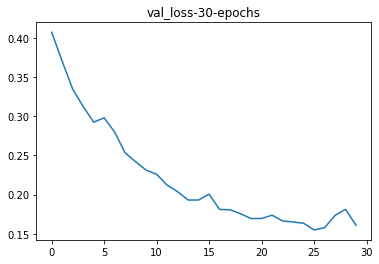

In [ ]:
fig = hist_df_30_epochs['val_loss'].plot()
plt.title("val_loss-30-epochs")
plt.savefig("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/val_loss-30-epochs.png")

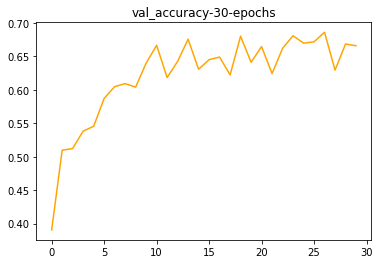

In [ ]:
fig = hist_df_30_epochs['val_accuracy'].plot(color='orange')
plt.title("val_accuracy-30-epochs")
plt.savefig("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/val_accuracy-30-epochs.png")

In [ ]:
hist_df_30_epochs.to_csv("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/history_30_epochs.csv")

### load the model

In [ ]:
#model.save("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/inceptionV3-30epochs-model.h5")

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/inceptionV3-30epochs-model.h5')

In [ ]:
train_generator.next()[1][0]

NameError: ignored

In [ ]:
img = train_generator.next()[0][0]
img = img.reshape((1,299,299,3))
label = train_generator.next()[1][0]

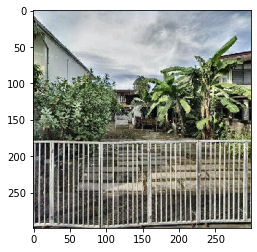

In [ ]:
plt.imshow(train_generator.next()[0][0])

In [ ]:
a = model.predict(img)
a = (a>0.5)
a = a.astype(int)
a

array([[0, 1, 0, 0, 0, 0]])

# Prediction

In [ ]:
file_name = os.listdir("/content/house-grade-classification/test/")
df_test_1 = pd.DataFrame(data=file_name, columns=['filename'])
df_test_1['path'] = df_test_1['filename'].apply(lambda x:"/content/house-grade-classification/test/" + x)
df_test_1

,filename,path
0,fc392185.jpg,/content/house-grade-classification/test/fc392...
1,4591da5f.jpg,/content/house-grade-classification/test/4591d...
2,7e8862e8.jpg,/content/house-grade-classification/test/7e886...
3,79e5e450.jpg,/content/house-grade-classification/test/79e5e...
4,c4fb5b5c.jpg,/content/house-grade-classification/test/c4fb5...
...,...,...
445,897e6108.jpg,/content/house-grade-classification/test/897e6...
446,ca941aa3.jpg,/content/house-grade-classification/test/ca941...
447,ecc33630.jpg,/content/house-grade-classification/test/ecc33...
448,0188f57d.jpg,/content/house-grade-classification/test/0188f...


In [ ]:
file_name_2 = os.listdir("/content/finaltest")
df_test_2 = pd.DataFrame(data=file_name_2, columns=['filename'])
df_test_2['path'] = df_test_2['filename'].apply(lambda x:"/content/finaltest/" + x)
df_test_2

,filename,path
0,f0ea0a13.jpg,/content/finaltest/f0ea0a13.jpg
1,e035ad5b.jpg,/content/finaltest/e035ad5b.jpg
2,17daad98.jpg,/content/finaltest/17daad98.jpg
3,34b5c210.jpg,/content/finaltest/34b5c210.jpg
4,8f81b246.jpg,/content/finaltest/8f81b246.jpg
...,...,...
1095,acd08c44.jpg,/content/finaltest/acd08c44.jpg
1096,774f33a8.jpg,/content/finaltest/774f33a8.jpg
1097,5f033aaf.jpg,/content/finaltest/5f033aaf.jpg
1098,5e2d50a4.jpg,/content/finaltest/5e2d50a4.jpg


In [ ]:
df_test = pd.concat([df_test_1, df_test_2], axis=0)
df_test

,filename,path
0,fc392185.jpg,/content/house-grade-classification/test/fc392...
1,4591da5f.jpg,/content/house-grade-classification/test/4591d...
2,7e8862e8.jpg,/content/house-grade-classification/test/7e886...
3,79e5e450.jpg,/content/house-grade-classification/test/79e5e...
4,c4fb5b5c.jpg,/content/house-grade-classification/test/c4fb5...
...,...,...
1095,acd08c44.jpg,/content/finaltest/acd08c44.jpg
1096,774f33a8.jpg,/content/finaltest/774f33a8.jpg
1097,5f033aaf.jpg,/content/finaltest/5f033aaf.jpg
1098,5e2d50a4.jpg,/content/finaltest/5e2d50a4.jpg


### make test image to be high-contrast

In [ ]:
from albumentations import *
import albumentations as A
import cv2
from PIL import Image
from tqdm import tqdm

def get_augmented_image(org_img, albs, num_pics): #org_img : numpy array height*width*3
  img_list = []

  for _ in range(num_pics):
    aug_img = albs(image = org_img)['image']
    img_list.append(aug_img)
  
  return img_list

def read_pic(path): #size=(299,299)
  img = cv2.imread(path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  size = img.shape
  if (size==(299,299)):
    img = cv2.resize(img, size, interpolation=cv2.INTER_LINEAR)
  return img

def create_albumentation():
  transform = A.Compose([
    A.CLAHE(p=1, clip_limit=4.0, tile_grid_size=(8, 8)) #make contrast shaper
  ])
  return transform

# -----------------------------------------------------------------------------------------------------------------------------------------
# augment_each_class is a function for generate augmented image
# you can choose an amount of images to gen per 1 image
# then, it will gen image an save the image files in a directory you want

def augment_each_class(df_class, amountToGen, folder_name = None): # amountToGen : per image

  for i in tqdm(range(len(df_class))): # df_class is df that contains only specific label that we have selected ex. df_1
    img = read_pic(path = df_class.iloc[i]['path'])
    transform = create_albumentation() # put shape of the image for selecting best albumentation in create_albumentation() function
    img_list = get_augmented_image(org_img=img, albs=transform, num_pics=amountToGen)

    #save to folder
    for j in range(len(img_list)):
      image = Image.fromarray(img_list[j], 'RGB')
      image.save('/content/{}/{}'.format(folder_name, df_class.iloc[i]['filename']))


In [ ]:
!mkdir test_high_contrast

In [ ]:
augment_each_class(df_test, 1, "test_high_contrast")

100%|██████████| 1550/1550 [00:50<00:00, 30.65it/s]


### with no highcontrast

In [ ]:
!mkdir test_normal

In [ ]:
import shutil
from tqdm import tqdm

path = df_test['path'].values

for i in tqdm(path):
  src_path = i
  dst_path = "/content/test_normal"
  shutil.copy(src_path, dst_path)

100%|██████████| 1550/1550 [00:00<00:00, 2287.23it/s]


### update path

In [ ]:
df_test['path'] = df_test['filename'].apply(lambda x:"/content/test_high_contrast/"+x)
df_test.reset_index(drop=True, inplace=True)

,filename,path
0,fc392185.jpg,/content/test_high_contrast/fc392185.jpg
1,4591da5f.jpg,/content/test_high_contrast/4591da5f.jpg
2,7e8862e8.jpg,/content/test_high_contrast/7e8862e8.jpg
3,79e5e450.jpg,/content/test_high_contrast/79e5e450.jpg
4,c4fb5b5c.jpg,/content/test_high_contrast/c4fb5b5c.jpg
...,...,...
1095,acd08c44.jpg,/content/test_high_contrast/acd08c44.jpg
1096,774f33a8.jpg,/content/test_high_contrast/774f33a8.jpg
1097,5f033aaf.jpg,/content/test_high_contrast/5f033aaf.jpg
1098,5e2d50a4.jpg,/content/test_high_contrast/5e2d50a4.jpg


In [ ]:
df_test['path'] = df_test['filename'].apply(lambda x:"/content/test_normal/"+x)
df_test.reset_index(drop=True, inplace=True)
df_test

,filename,path
0,fc392185.jpg,/content/test_normal/fc392185.jpg
1,4591da5f.jpg,/content/test_normal/4591da5f.jpg
2,7e8862e8.jpg,/content/test_normal/7e8862e8.jpg
3,79e5e450.jpg,/content/test_normal/79e5e450.jpg
4,c4fb5b5c.jpg,/content/test_normal/c4fb5b5c.jpg
...,...,...
1545,acd08c44.jpg,/content/test_normal/acd08c44.jpg
1546,774f33a8.jpg,/content/test_normal/774f33a8.jpg
1547,5f033aaf.jpg,/content/test_normal/5f033aaf.jpg
1548,5e2d50a4.jpg,/content/test_normal/5e2d50a4.jpg


### predict test

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

In [ ]:
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator = test_datagen.flow_from_dataframe(
  dataframe=df_test,
  directory="/content/test_high_contrast/",
  x_col="filename",
  batch_size=1,
  seed=42,
  shuffle=False,
  class_mode=None,
  target_size=(299,299))

Found 1550 validated image filenames.


In [ ]:
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator = test_datagen.flow_from_dataframe(
  dataframe=df_test,
  directory="/content/test_normal/",
  x_col="filename",
  batch_size=1,
  seed=42,
  shuffle=False,
  class_mode=None,
  target_size=(299,299))

Found 1550 validated image filenames.


You need to reset the test_generator before whenever you call the predict_generator. This is important, if you forget to reset the test_generator you will get outputs in a weird order.

In [ ]:
STEP_SIZE_TEST = test_generator.n // test_generator.batch_size

In [ ]:
test_generator.reset()
pred = model.predict_generator(test_generator,
                  steps=STEP_SIZE_TEST,
                  verbose=1)

   5/1550 [..............................] - ETA: 23s 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  after removing the cwd from sys.path.


1550/1550 [==============================] - 25s 16ms/step


In [ ]:
pred

array([[1.3939841e-01, 5.4400531e-05, 7.0489265e-02, 9.8536104e-01,
        6.3049651e-05, 3.9185272e-04],
       [8.7259626e-01, 1.2688331e-06, 1.0373411e-03, 2.5670975e-01,
        4.6574332e-06, 8.2559057e-04],
       [9.7778398e-01, 1.5824497e-06, 2.6922461e-01, 1.0323555e-01,
        1.9590691e-09, 3.7926778e-08],
       ...,
       [9.3483530e-02, 2.3695202e-04, 9.5763022e-01, 4.6368936e-01,
        4.3120050e-05, 2.2659180e-01],
       [5.3936536e-03, 2.3900682e-05, 1.2749027e-01, 9.3999875e-01,
        4.4242714e-02, 2.6000347e-02],
       [2.9964179e-01, 2.6709957e-03, 4.0969383e-02, 6.1697453e-01,
        5.5503011e-02, 3.2960929e-06]], dtype=float32)

In [ ]:
pred_bool = (pred >0.5)
pred_bool

array([[False, False, False,  True, False, False],
       [ True, False, False, False, False, False],
       [ True, False, False, False, False, False],
       ...,
       [False, False,  True, False, False, False],
       [False, False, False,  True, False, False],
       [False, False, False,  True, False, False]])

In [ ]:
predictions = pred_bool.astype(int)
columns=["0", "1", "2", "3", "4", "5"]
#columns should be the same order of y_col
results = pd.DataFrame(predictions, columns=columns)
results.insert(loc=0, column='filename', value=test_generator.filenames)
results.insert(loc=1, column='path', value=results['filename'].apply(lambda x:"/content/test_high_contrast/" + x))
results['Id'] = results['filename'].apply(lambda x:x.split(".")[0])
results

,filename,path,0,1,2,3,4,5,Id
0,fc392185.jpg,/content/test_high_contrast/fc392185.jpg,0,0,0,1,0,0,fc392185
1,4591da5f.jpg,/content/test_high_contrast/4591da5f.jpg,1,0,0,0,0,0,4591da5f
2,7e8862e8.jpg,/content/test_high_contrast/7e8862e8.jpg,1,0,0,0,0,0,7e8862e8
3,79e5e450.jpg,/content/test_high_contrast/79e5e450.jpg,0,0,0,0,0,0,79e5e450
4,c4fb5b5c.jpg,/content/test_high_contrast/c4fb5b5c.jpg,0,0,1,1,0,0,c4fb5b5c
...,...,...,...,...,...,...,...,...,...
1545,acd08c44.jpg,/content/test_high_contrast/acd08c44.jpg,0,0,0,1,0,0,acd08c44
1546,774f33a8.jpg,/content/test_high_contrast/774f33a8.jpg,1,0,0,0,0,0,774f33a8
1547,5f033aaf.jpg,/content/test_high_contrast/5f033aaf.jpg,0,0,1,0,0,0,5f033aaf
1548,5e2d50a4.jpg,/content/test_high_contrast/5e2d50a4.jpg,0,0,0,1,0,0,5e2d50a4


In [ ]:
def return_class(label): # label = [1,0,1,0,0,0]
  class_label = ""
  for i in range(6):
    if label[i] == 1:
      class_label = class_label + " " + str(i)
  return class_label[1:]

In [ ]:
labels = []
for i in tqdm(range(len(results))):
  ans = results.loc[i, ['0','1','2','3','4','5']].values
  ans = return_class(ans)
  labels.append(ans)

100%|██████████| 1550/1550 [00:00<00:00, 2013.69it/s]


In [ ]:
results.insert(loc=2, column='predicted', value = labels)
results

,filename,path,predicted,0,1,2,3,4,5,Id
0,fc392185.jpg,/content/test_high_contrast/fc392185.jpg,3,0,0,0,1,0,0,fc392185
1,4591da5f.jpg,/content/test_high_contrast/4591da5f.jpg,0,1,0,0,0,0,0,4591da5f
2,7e8862e8.jpg,/content/test_high_contrast/7e8862e8.jpg,0,1,0,0,0,0,0,7e8862e8
3,79e5e450.jpg,/content/test_high_contrast/79e5e450.jpg,,0,0,0,0,0,0,79e5e450
4,c4fb5b5c.jpg,/content/test_high_contrast/c4fb5b5c.jpg,2 3,0,0,1,1,0,0,c4fb5b5c
...,...,...,...,...,...,...,...,...,...,...
1545,acd08c44.jpg,/content/test_high_contrast/acd08c44.jpg,3,0,0,0,1,0,0,acd08c44
1546,774f33a8.jpg,/content/test_high_contrast/774f33a8.jpg,0,1,0,0,0,0,0,774f33a8
1547,5f033aaf.jpg,/content/test_high_contrast/5f033aaf.jpg,2,0,0,1,0,0,0,5f033aaf
1548,5e2d50a4.jpg,/content/test_high_contrast/5e2d50a4.jpg,3,0,0,0,1,0,0,5e2d50a4


In [ ]:
results['predicted'].value_counts() #10epochs

2 3      97
0        95
3        67
         49
2        40
5        25
0 3      14
0 2      11
0 5       9
4         8
2 5       6
2 3 4     6
0 2 3     5
1         5
0 4       3
2 3 5     3
2 4       3
3 4       1
0 1       1
1 3       1
3 5       1
Name: labels, dtype: int64

In [ ]:
results['predicted'].value_counts() #30epochs

0        135
3         81
2 3       80
          36
2         30
5         23
0 5       11
0 3       11
0 2       11
2 3 5      7
2 5        6
2 3 4      3
3 5        3
4          3
4 5        2
0 2 3      2
1          2
3 4        2
0 4        2
Name: predicted, dtype: int64

In [ ]:
results['predicted'].value_counts() #30epochs #fixed the path

2 3      92
0        85
3        68
         55
5        48
2        23
4        18
2 5      15
2 3 5     8
3 5       7
2 3 4     7
2 4       5
0 3       4
3 4       3
0 5       3
0 4       3
1         2
0 2       1
0 3 5     1
1 5       1
1 2       1
Name: predicted, dtype: int64

In [ ]:
results['predicted'].value_counts() #30epochs final test high contrast

2 3        292
0          280
3          249
           198
2          140
5          129
2 5         48
0 3         34
4           33
2 3 5       25
0 5         23
0 2         19
3 5         17
2 3 4       16
3 4         13
2 4          8
1            6
4 5          5
0 4          4
0 2 3        4
2 3 4 5      2
0 2 5        1
2 4 5        1
1 2          1
1 3          1
1 2 3        1
Name: predicted, dtype: int64

In [ ]:
results['predicted'].value_counts() #30epochs final test normal

0          489
3          284
2 3        259
2          127
           118
5           67
0 3         52
0 2         40
0 5         26
2 5         22
2 3 5       17
3 5         11
2 3 4        8
3 4          6
4            5
0 2 3        5
1            4
2 4          4
0 4          3
4 5          2
2 3 4 5      1
Name: predicted, dtype: int64

### check some answer

In [ ]:
a = results[results['labels'] == '2 3 4']
a

,filename,path,labels,0,1,2,3,4,5,Id
227,0fb8776e.jpg,/content/test_high_contrast/0fb8776e.jpg,2 3 4,0,0,1,1,1,0,0fb8776e
229,35c37bfb.jpg,/content/test_high_contrast/35c37bfb.jpg,2 3 4,0,0,1,1,1,0,35c37bfb
333,8ce30277.jpg,/content/test_high_contrast/8ce30277.jpg,2 3 4,0,0,1,1,1,0,8ce30277


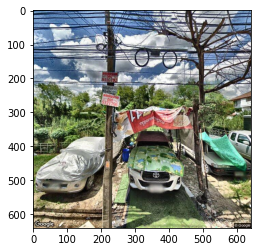

In [ ]:
img = cv2.imread(results.loc[227, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

### post-processing

- อันนี้ มี 0 แล้วตอบ class อื่นด้วย ให้ปัดเป็น class นั้นๆ
- อันไหนไม่มีคำตอบ ให้เป็น 0

In [ ]:
a = '0 3'
print(len(a))
if "0" in a:
  print("yes")

3
yes


In [ ]:
from tqdm import tqdm

for i in tqdm(range(len(results))):
  label = results.loc[i, 'predicted']
  if "0" in label:
    if len(label) > 1:
      #print(label)
      label = label[2:]
      #print(label)
      results.loc[i, 'predicted'] = label

100%|██████████| 1550/1550 [00:00<00:00, 32327.73it/s]


In [ ]:
results['predicted'].value_counts() #30epochs fixed path

2 3      92
0        85
3        72
         55
5        51
2        24
4        21
2 5      15
3 5       8
2 3 5     8
2 3 4     7
2 4       5
3 4       3
1         2
1 5       1
1 2       1
Name: predicted, dtype: int64

In [ ]:
results['predicted'].value_counts() #30epochs final test high contrast

2 3        296
3          283
0          280
           198
2          159
5          152
2 5         49
4           37
2 3 5       25
3 5         17
2 3 4       16
3 4         13
2 4          8
1            6
4 5          5
2 3 4 5      2
2 4 5        1
1 2          1
1 3          1
1 2 3        1
Name: predicted, dtype: int64

In [ ]:
results['predicted'].value_counts() #30epochs final test normal

0          489
3          336
2 3        264
2          167
           118
5           93
2 5         22
2 3 5       17
3 5         11
4            8
2 3 4        8
3 4          6
1            4
2 4          4
4 5          2
2 3 4 5      1
Name: predicted, dtype: int64

In [ ]:
for i in tqdm(range(len(results))):
  label = results.loc[i, 'predicted']
  if label == "": # อันไหน class ว่าง ให้เติม class 0
    label = "0"
    results.loc[i, 'predicted'] = label

100%|██████████| 1550/1550 [00:00<00:00, 36042.93it/s]


In [ ]:
results['predicted'].value_counts() #10epochs

0        144
2 3      102
3         81
2         51
5         34
4         11
2 3 4      6
2 5        6
1          6
2 3 5      3
2 4        3
3 4        1
1 3        1
3 5        1
Name: labels, dtype: int64

In [ ]:
results['predicted'].value_counts() #30epochs

0        171
3         92
2 3       82
2         41
5         34
2 3 5      7
2 5        6
4          5
2 3 4      3
3 5        3
3 4        2
1          2
4 5        2
Name: predicted, dtype: int64

In [ ]:
results['predicted'].value_counts() #30epochs fixed path

0        140
2 3       92
3         72
5         51
2         24
4         21
2 5       15
3 5        8
2 3 5      8
2 3 4      7
2 4        5
3 4        3
1          2
1 5        1
1 2        1
Name: predicted, dtype: int64

In [ ]:
results['predicted'].value_counts() #30epochs final test high contrast

0          478
2 3        296
3          283
2          159
5          152
2 5         49
4           37
2 3 5       25
3 5         17
2 3 4       16
3 4         13
2 4          8
1            6
4 5          5
2 3 4 5      2
2 4 5        1
1 2          1
1 3          1
1 2 3        1
Name: predicted, dtype: int64

In [ ]:
results['predicted'].value_counts() #30epochs final test normal

0          607
3          336
2 3        264
2          167
5           93
2 5         22
2 3 5       17
3 5         11
4            8
2 3 4        8
3 4          6
1            4
2 4          4
4 5          2
2 3 4 5      1
Name: predicted, dtype: int64

In [ ]:
results

,filename,path,predicted,0,1,2,3,4,5,Id
0,fc392185.jpg,/content/test_high_contrast/fc392185.jpg,3,0,0,0,1,0,0,fc392185
1,4591da5f.jpg,/content/test_high_contrast/4591da5f.jpg,0,1,0,0,0,0,0,4591da5f
2,7e8862e8.jpg,/content/test_high_contrast/7e8862e8.jpg,0,1,0,0,0,0,0,7e8862e8
3,79e5e450.jpg,/content/test_high_contrast/79e5e450.jpg,0,0,0,0,0,0,0,79e5e450
4,c4fb5b5c.jpg,/content/test_high_contrast/c4fb5b5c.jpg,2 3,0,0,1,1,0,0,c4fb5b5c
...,...,...,...,...,...,...,...,...,...,...
1545,acd08c44.jpg,/content/test_high_contrast/acd08c44.jpg,3,0,0,0,1,0,0,acd08c44
1546,774f33a8.jpg,/content/test_high_contrast/774f33a8.jpg,0,1,0,0,0,0,0,774f33a8
1547,5f033aaf.jpg,/content/test_high_contrast/5f033aaf.jpg,2,0,0,1,0,0,0,5f033aaf
1548,5e2d50a4.jpg,/content/test_high_contrast/5e2d50a4.jpg,3,0,0,0,1,0,0,5e2d50a4


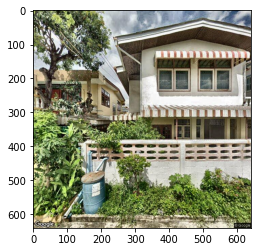

In [ ]:
img = cv2.imread(results.loc[197, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

# Submission file

In [ ]:
sub = pd.read_csv("/content/properties-tagging/sample_submission.csv")
sub

,Id,Labels
0,d5461e01,2 3
1,0e6bd6ea,0
2,03df66ca,3
3,bdf217f5,NaN
4,632726ba,NaN
...,...,...
1545,98768d3f,NaN
1546,34f08e48,NaN
1547,4337ff85,NaN
1548,825b04fe,NaN


In [ ]:
results_sub = results.loc[:, ['Id', 'predicted']] # results มี labels แอลตัวเล็ก
results_sub

,Id,predicted
0,fc392185,3
1,4591da5f,0
2,7e8862e8,0
3,79e5e450,0
4,c4fb5b5c,2 3
...,...,...
1545,acd08c44,3
1546,774f33a8,0
1547,5f033aaf,2
1548,5e2d50a4,3


In [ ]:
df_sub = sub.merge(results_sub, on='Id', how='left')
df_sub

,Id,Labels,predicted
0,d5461e01,2 3,0
1,0e6bd6ea,0,0
2,03df66ca,3,0
3,bdf217f5,NaN,0
4,632726ba,NaN,4
...,...,...,...
1545,98768d3f,NaN,2 3
1546,34f08e48,NaN,2 3
1547,4337ff85,NaN,3
1548,825b04fe,NaN,3


In [ ]:
df_sub.drop("Labels", axis=1, inplace=True)
df_sub.rename({"predicted":"Labels"}, axis=1, inplace=True)
df_sub

,Id,Labels
0,d5461e01,0
1,0e6bd6ea,0
2,03df66ca,0
3,bdf217f5,0
4,632726ba,4
...,...,...
1545,98768d3f,2 3
1546,34f08e48,2 3
1547,4337ff85,3
1548,825b04fe,3


In [ ]:
df_sub.set_index("Id", inplace=True)
df_sub

,Labels
Id,
d5461e01,0
0e6bd6ea,0
03df66ca,0
bdf217f5,0
632726ba,4
...,...
98768d3f,2 3
34f08e48,2 3
4337ff85,3


In [ ]:
df_sub['Labels'].value_counts() #high contrast

0          478
2 3        296
3          283
2          159
5          152
2 5         49
4           37
2 3 5       25
3 5         17
2 3 4       16
3 4         13
2 4          8
1            6
4 5          5
2 3 4 5      2
1 2          1
2 4 5        1
1 3          1
1 2 3        1
Name: Labels, dtype: int64

In [ ]:
df_sub['Labels'].value_counts() #30epochs final test normal

0          607
3          336
2 3        264
2          167
5           93
2 5         22
2 3 5       17
3 5         11
4            8
2 3 4        8
3 4          6
1            4
2 4          4
4 5          2
2 3 4 5      1
Name: Labels, dtype: int64

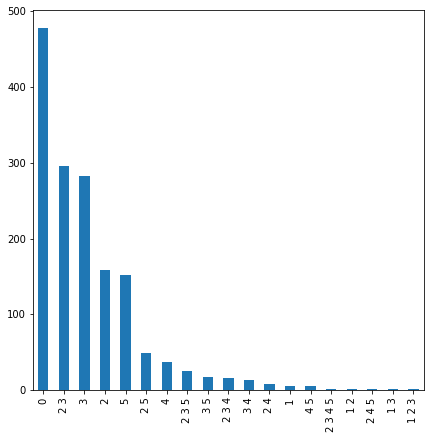

In [ ]:
plt.figure(figsize=(7,7))
df_sub['Labels'].value_counts().plot(kind="bar")

In [ ]:
df_sub.to_csv("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/submission-final_test_set_normal.csv")

# Get labels of validatation set to plot Confusion Matrix

In [ ]:
img = cv2.imread(df_valid.loc[6903, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (299,299))
img = img/255
img = img.reshape((1,299,299,3))

a = model.predict(img)
a = (a>0.5)
a = a.astype(int)
a = a[0]
a

array([0, 0, 0, 0, 1, 0])

In [ ]:
result_actual_valid = df_valid[['0','1','2','3','4','5']].values
result_actual_valid

array([[0., 0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 1., 1., 0., 1.],
       ...,
       [0., 0., 1., 1., 1., 0.],
       [0., 0., 0., 1., 1., 0.],
       [0., 0., 1., 0., 0., 0.]])

In [ ]:
len(result_actual_valid)

1564

In [ ]:
prediction_valid = []
index = df_valid.index

for i in tqdm(index):
  img = cv2.imread(df_valid.loc[i, 'path'])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, (299,299))
  img = img/255
  img = img.reshape((1,299,299,3))
  
  pred_valid = model.predict(img)
  pred_valid = (pred_valid>0.5)
  pred_valid = pred_valid.astype(int)
  pred_valid = pred_valid[0]
  prediction_valid.append(pred_valid)
  #print(pred_valid)

prediction_valid = np.array(prediction_valid)

100%|██████████| 1564/1564 [03:16<00:00,  7.94it/s]


In [ ]:
len(prediction_valid)

1564

In [ ]:
np.save("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/y_actual_valid.npy", result_actual_valid)
np.save("/content/drive/MyDrive/PiceFolder/Hack 5/inceptionv3-Ver2/y_pred_valid.npy", prediction_valid)

In [ ]:
prediction_valid_label_form = []
for i in prediction_valid:
  prediction_valid_label_form.append(return_class(i))

In [ ]:
df_valid['predicted'] = prediction_valid_label_form
df_valid

,filename,path,labels,0,1,2,3,4,5,predicted
6903,img_13-7575534_100-5286113_a99-27412993_s189-2...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,4,0.0,0.0,0.0,0.0,1.0,0.0,4
4747,img_13-7595067_100-6074915_a39-26717235_s309-2...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,0,1.0,0.0,0.0,0.0,0.0,0.0,0
733,img_13-7999218_100-577045_a170-2816838_s260-28...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 3 5,0.0,0.0,1.0,1.0,0.0,1.0,2 3 5
1365,img_13-7907344_100-6153692_a211-0707294_s301-0...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,0,1.0,0.0,0.0,0.0,0.0,0.0,2 3 5
3993,img_13-7813564_100-5754453_a187-5673487_s97-56...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,4,0.0,0.0,0.0,0.0,1.0,0.0,4
...,...,...,...,...,...,...,...,...,...,...
1911,img_13-7922887_100-5637574_a3-192185291_s273-1...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 5,0.0,0.0,1.0,0.0,0.0,1.0,2 5
11495,ChokChai4_img_13-8004443_100-5865305_a92-89613...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,1 2 3,0.0,1.0,1.0,1.0,0.0,0.0,1 2 3
8879,img_13-7813564_100-5754453_a187-5673487_s277-5...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,2 3 4,0.0,0.0,1.0,1.0,1.0,0.0,2 3 4
8520,img_13-8080005_100-5992354_a81-61213397_s351-6...,/content/drive/MyDrive/PiceFolder/Hack 5/incep...,3 4,0.0,0.0,0.0,1.0,1.0,0.0,3 4


### Check Result - validation set

check class 1

In [ ]:
df_valid_class_1 = df_valid[df_valid['1'] == 1]
df_valid_class_1[['labels', 'predicted']]

,labels,predicted
6408,1 2 3,1 2 3
1189,1,1
6836,1,1
10874,1,1
9364,1 3,1 3
...,...,...
1205,1 3,1 3
11362,1,1
3681,1 5,1 5
6218,1,1


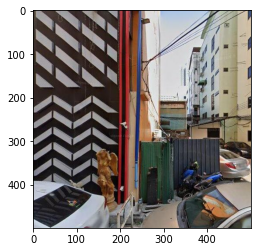

In [ ]:
img = cv2.imread(df_valid.loc[9364, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

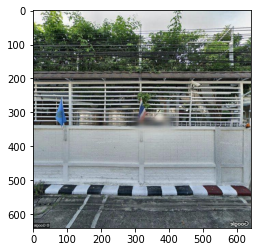

In [ ]:
img = cv2.imread(df_valid.loc[10874, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

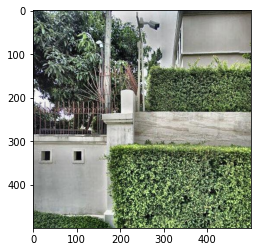

In [ ]:
img = cv2.imread(df_valid.loc[3681, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

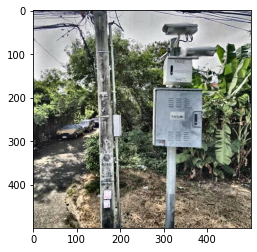

In [ ]:
img = cv2.imread(df_valid.loc[6218, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

check class 2

In [ ]:
df_valid_class_2 = df_valid[df_valid['2'] == 1]
df_valid_class_2[['labels', 'predicted']]

,labels,predicted
733,2 3 5,2 3 5
5705,2 3,2 3
6408,1 2 3,1 2 3
334,2 3,2 3
4441,2 3,2
...,...,...
3689,2 3 4,2 3
1911,2 5,2 5
11495,1 2 3,1 2 3
8879,2 3 4,2 3 4


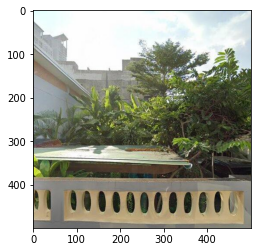

In [ ]:
img = cv2.imread(df_valid.loc[733, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

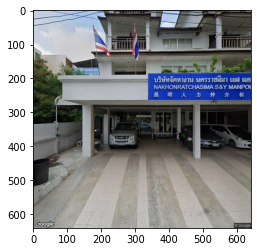

In [ ]:
img = cv2.imread(df_valid.loc[4441, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

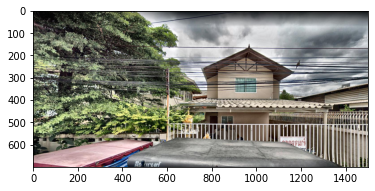

In [ ]:
img = cv2.imread(df_valid.loc[3689, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

class 4

In [ ]:
df_valid_class_4 = df_valid[df_valid['4'] == 1]
df_valid_class_4[['labels', 'predicted']]

,labels,predicted
6903,4,4
3993,4,4
8276,4,4
7813,4 5,4 5
8977,4,4
...,...,...
11285,3 4,3 4
1641,4,2
3689,2 3 4,2 3
8879,2 3 4,2 3 4


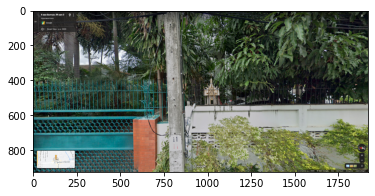

In [ ]:
img = cv2.imread(df_valid.loc[7813, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

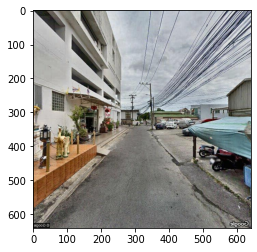

In [ ]:
img = cv2.imread(df_valid.loc[8977, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

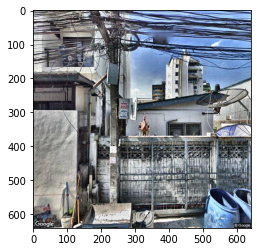

In [ ]:
img = cv2.imread(df_valid.loc[1641, 'path'])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)